In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import plotnine as pn
from plotnine import *
from tqdm import tqdm
import yaml
from collections import defaultdict

In [4]:
def load_run_files(run_id, what=["losses", "tau_T", "tau_history", "times", "posterior", "beta", "mu", "r2"]): 
    result = {}
    
    # Handle new format: "seed_genes_minmax_noT_b1/run_1" or old format: "run_1"
    if '/' in run_id:
        # New format: extract directory and base run name
        batch_name, base_run_id = run_id.split('/', 1)
        # Use run_to_dir if available (from Cell 1)
        # Check both globals() and locals() to find run_to_dir
        run_to_dir_dict = None
        if 'run_to_dir' in globals():
            run_to_dir_dict = globals()['run_to_dir']
        elif 'run_to_dir' in locals():
            run_to_dir_dict = locals()['run_to_dir']
        
        if run_to_dir_dict is not None and run_id in run_to_dir_dict:
            run_dir = os.path.join(run_to_dir_dict[run_id], base_run_id)
            if not os.path.isdir(run_dir):
                run_dir = None
        else:
            run_dir = None
        
        # Fallback: find directory by batch name if run_to_dir didn't work
        if run_dir is None:
            for search_dir in OUTPUT_DIRS_NoT:
                # Match by exact batch name (use basename to avoid partial matches)
                search_basename = os.path.basename(search_dir)
                if batch_name == search_basename:
                    test_path = os.path.join(search_dir, base_run_id)
                    if os.path.isdir(test_path):
                        run_dir = test_path
                        break
    else:
        # Old format or T run: extract base run_id (remove suffix like _1, _2, etc. if present)
        parts = run_id.split('_')
        if len(parts) >= 3 and parts[-1].isdigit():
            base_run_id = '_'.join(parts[:-1])
        else:
            base_run_id = run_id
        
        # Search in both T and NoT directories
        search_dirs = [OUTPUT_DIR_T] + OUTPUT_DIRS_NoT
        
        # Find which directory contains this run
        run_dir = None
        for search_dir in search_dirs:
            if not os.path.exists(search_dir):
                continue
            for test_id in [run_id, base_run_id]:
                test_path = os.path.join(search_dir, test_id)
                if os.path.isdir(test_path):
                    run_dir = test_path
                    break
            if run_dir:
                break
    
    if run_dir is None:
        return result  # Return empty dict if run directory not found
    
    # Helper function to safely load file
    def safe_load_file(file_path, loader_func, **kwargs):
        if os.path.exists(file_path):
            try:
                return loader_func(file_path, **kwargs)
            except Exception:
                return None
        return None
    
    if "losses" in what:    
        losses_file = os.path.join(run_dir, "losses.txt")
        result["losses"] = safe_load_file(losses_file, pd.read_csv, header=None)
    if "tau_T" in what:
        tau_T_file = os.path.join(run_dir, "tau_T.csv")
        result["tau_T"] = safe_load_file(tau_T_file, pd.read_csv)
    if "tau_history" in what:
        tau_history_file = os.path.join(run_dir, "tau_history.csv")
        result["tau_history"] = safe_load_file(tau_history_file, pd.read_csv, index_col=0)
    if "times" in what:
        times_file = os.path.join(run_dir, "times.txt")
        result["times"] = safe_load_file(times_file, pd.read_csv)
    if "posterior" in what:
        posterior_file = os.path.join(run_dir, "posterior_stats.npz")
        result["posterior"] = safe_load_file(posterior_file, np.load, allow_pickle=True)
    if "beta" in what:
        beta_file = os.path.join(run_dir, "beta_samples", "all_beta_samples.npz")
        result["beta"] = safe_load_file(beta_file, np.load, allow_pickle=True)
    if "mu" in what:
        mu_file = os.path.join(run_dir, "mu_samples", "all_mu_samples.npz")
        result["mu"] = safe_load_file(mu_file, np.load, allow_pickle=True)
    if "r2_test" in what:
        r2_file = os.path.join(run_dir, "test_r2_scores.csv")
        result["r2_test"] = safe_load_file(r2_file, pd.read_csv)
    if "r2_train" in what:
        r2_file = os.path.join(run_dir, "train_r2_scores.csv")
        result["r2_train"] = safe_load_file(r2_file, pd.read_csv)
    
    return result

In [5]:
# Helper function to find config file across directories
def find_config_file(run_id):
    """Find config.yaml file for a run across all output directories."""
    # Handle new format: "seed_genes_minmax_noT_b1/run_1" or old format: "run_1"
    if '/' in run_id:
        # New format: extract directory and base run name
        batch_name, base_run_id = run_id.split('/', 1)
        # Use run_to_dir if available (from Cell 1)
        if 'run_to_dir' in globals() and run_id in run_to_dir:
            config_path = os.path.join(run_to_dir[run_id], base_run_id, "config.yaml")
            if os.path.exists(config_path):
                return config_path
        else:
            # Fallback: find directory by exact batch name match
            for search_dir in OUTPUT_DIRS_NoT:
                search_basename = os.path.basename(search_dir)
                if batch_name == search_basename:
                    config_path = os.path.join(search_dir, base_run_id, "config.yaml")
                    if os.path.exists(config_path):
                        return config_path
    else:
        # Old format or T run: extract base run_id (remove suffix like _1, _2, etc. if present)
        parts = run_id.split('_')
        if len(parts) >= 3 and parts[-1].isdigit():
            base_run_id = '_'.join(parts[:-1])
        else:
            base_run_id = run_id
        
        search_dirs = [OUTPUT_DIR_T] + OUTPUT_DIRS_NoT
        for search_dir in search_dirs:
            if not os.path.exists(search_dir):
                continue
            for test_id in [run_id, base_run_id]:
                config_path = os.path.join(search_dir, test_id, "config.yaml")
                if os.path.exists(config_path):
                    return config_path
    return None


In [12]:
# Plot losses for T and NoT separately
for run_type, lr_dict in [('T', lr_to_runs_T), ('NoT', lr_to_runs_NoT)]:
    if len(lr_dict) == 0:
        continue
    plt.figure(figsize=(10, 6))
    for lr, runs in lr_dict.items():
        if len(runs) > 0:
            run_id = runs[0]  # take first as representative
            losses = load_run_files(run_id, what=["losses"]).get("losses")
            if losses is not None:
                plt.plot(losses, label=f"lr={lr}")
    plt.title(f"Train loss different lr - {run_type}")
    plt.legend()
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.show()

NameError: name 'lr_to_runs_T' is not defined

In [6]:
# Load R2 data from all runs, processing T and NoT separately
def process_r2_data(run_list, run_type):
    """Process R2 data for a list of runs."""
    r2_data = []
    loaded_dirs = {}  # Track which directory each run_id loads from
    for run_id in run_list:
        try:
            # Debug: Check which directory this run_id loads from
            if run_type == 'NoT' and len(loaded_dirs) < 10:  # Only check first 10 for debugging
                # Try to find the directory
                if '/' in run_id:
                    batch_name, base_run_id = run_id.split('/', 1)
                    if 'run_to_dir' in globals() and run_id in globals()['run_to_dir']:
                        loaded_dir = os.path.join(globals()['run_to_dir'][run_id], base_run_id)
                        loaded_dirs[run_id] = loaded_dir
                        if len(loaded_dirs) <= 5:  # Print first 5
                            print(f"Debug: {run_id} -> {loaded_dir}")
            
            r2_test = load_run_files(run_id, what=["r2_test"]).get("r2_test")
            r2_train = load_run_files(run_id, what=["r2_train"]).get("r2_train")
            if r2_test is not None and r2_train is not None:
                # Load config to get metadata
                config_file = find_config_file(run_id)
                if config_file:
                    with open(config_file, 'r') as f:
                        config = yaml.safe_load(f)
                    
                    # Merge train and test R2
                    r2_merged = r2_train.merge(r2_test, on='gene', suffixes=('_train', '_test'))
                    r2_merged['run_id'] = run_id
                    r2_merged['run_type'] = run_type
                    r2_merged['lr'] = config.get('lr', 'unknown')
                    r2_merged['epochs'] = config.get('epochs', 'unknown')
                    r2_data.append(r2_merged)
        except Exception as e:
            print(f"Warning: Could not load R2 data for {run_id}: {e}")
    
    # Debug: Check if different run_ids are loading from different directories
    if run_type == 'NoT' and len(loaded_dirs) > 1:
        unique_dirs = set(loaded_dirs.values())
        if len(unique_dirs) < len(loaded_dirs):
            print(f"WARNING: {len(loaded_dirs) - len(unique_dirs)} run_ids are loading from duplicate directories!")
            print(f"  Total run_ids checked: {len(loaded_dirs)}, Unique directories: {len(unique_dirs)}")
    
    return r2_data

# Process T and NoT runs separately
r2_data_T = process_r2_data(RUNS_T, 'T')
r2_data_NoT = process_r2_data(RUNS_NoT, 'NoT')

# Combine and process
all_r2_data = []
if len(r2_data_T) > 0:
    all_r2_data.extend(r2_data_T)
if len(r2_data_NoT) > 0:
    all_r2_data.extend(r2_data_NoT)

if len(all_r2_data) == 0:
    print("No R2 data found in any runs!")
else:
    r2_all = pd.concat(all_r2_data, ignore_index=True)
    
    # Process T and NoT separately for batching with different batch sizes
    batch_sizes = {'T': 10, 'NoT': 50}
    
    for run_type in ['T', 'NoT']:
        r2_type = r2_all[r2_all['run_type'] == run_type].copy()
        if len(r2_type) == 0:
            continue
            
        N = batch_sizes[run_type]
        print(f"\n{'='*80}")
        print(f"Processing {run_type} runs ({len(r2_type['run_id'].unique())} unique runs, batching by {N})")
        print(f"{'='*80}")
        
        # Group runs into batches of N
        unique_runs = sorted(r2_type['run_id'].unique())
        run_to_batch = {run_id: i // N for i, run_id in enumerate(unique_runs)}
        r2_type['batch'] = r2_type['run_id'].map(run_to_batch)
        
        # Debug: Print batch assignment for first few runs
        if run_type == 'NoT':
            print(f"\nDebug: First 10 run_ids and their batches:")
            for i, run_id in enumerate(unique_runs[:10]):
                print(f"  {run_id} -> Batch {run_to_batch[run_id]}")
            print(f"Total unique runs: {len(unique_runs)}")
            print(f"Number of batches: {len(set(run_to_batch.values()))}")
        
        # Average R2 per gene across runs in each batch
        r2_batched = r2_type.groupby(['batch', 'gene']).agg({
            'r2_train': 'mean',
            'r2_test': 'mean',
            'lr': 'first',
            'epochs': 'first'
        }).reset_index()
        
        # Create batch labels
        batch_labels = {}
        for batch_num in sorted(r2_batched['batch'].unique()):
            runs_in_batch = [run_id for run_id, b in run_to_batch.items() if b == batch_num]
            batch_labels[batch_num] = f"Batch {batch_num+1}\n({len(runs_in_batch)} runs)"
        
        r2_batched['batch_label'] = r2_batched['batch'].map(batch_labels)
        
        # 1. Box plot: R2 distribution across batches (train vs test)
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Train R2 by batch
        r2_batched.boxplot(column='r2_train', by='batch_label', ax=axes[0])
        axes[0].set_title(f'Train R2 Distribution Across Batches - {run_type} (Averaged over {N} runs)')
        axes[0].set_xlabel('Batch')
        axes[0].set_ylabel('Train R2')
        axes[0].tick_params(axis='x', rotation=45)
        
        # Test R2 by batch
        r2_batched.boxplot(column='r2_test', by='batch_label', ax=axes[1])
        axes[1].set_title(f'Test R2 Distribution Across Batches - {run_type} (Averaged over {N} runs)')
        axes[1].set_xlabel('Batch')
        axes[1].set_ylabel('Test R2')
        axes[1].tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        # 2. Scatter plot: Train vs Test R2, colored by batch
        plt.figure(figsize=(12, 8))
        for batch_num in sorted(r2_batched['batch'].unique()):
            batch_data = r2_batched[r2_batched['batch'] == batch_num]
            plt.scatter(batch_data['r2_train'], batch_data['r2_test'], 
                       label=batch_labels[batch_num], alpha=0.6, s=50)
        plt.plot([0, 1], [0, 1], 'k--', alpha=0.3, label='y=x')
        plt.xlabel('Train R2', fontsize=12)
        plt.ylabel('Test R2', fontsize=12)
        plt.title(f'Train vs Test R2 Across Batches - {run_type} (Averaged over {N} runs)', fontsize=14)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # 3. Average R2 per batch (bar plot)
        avg_r2_batch = r2_batched.groupby('batch').agg({
            'r2_train': 'mean',
            'r2_test': 'mean',
            'lr': 'first',
            'epochs': 'first'
        }).reset_index()
        avg_r2_batch['batch_label'] = avg_r2_batch['batch'].map(batch_labels)
        
        fig, ax = plt.subplots(figsize=(12, 6))
        x = np.arange(len(avg_r2_batch))
        width = 0.35
        ax.bar(x - width/2, avg_r2_batch['r2_train'], width, label='Train R2', alpha=0.8)
        ax.bar(x + width/2, avg_r2_batch['r2_test'], width, label='Test R2', alpha=0.8)
        ax.set_xlabel('Batch', fontsize=12)
        ax.set_ylabel('Average R2', fontsize=12)
        ax.set_title(f'Average R2 Scores Across Batches - {run_type} (Averaged over {N} runs)', fontsize=14)
        ax.set_xticks(x)
        ax.set_xticklabels(avg_r2_batch['batch_label'], rotation=45, ha='right')
        ax.legend()
        ax.grid(alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()
        
        # 4. Summary statistics table
        print(f"\nR2 Summary Statistics Across Batches - {run_type} (Averaged over {N} runs)")
        print("="*80)
        summary = r2_batched.groupby('batch').agg({
            'r2_train': ['mean', 'std', 'min', 'max'],
            'r2_test': ['mean', 'std', 'min', 'max'],
            'lr': 'first',
            'epochs': 'first'
        }).round(4)
        summary.index = [batch_labels[i] for i in summary.index]
        print(summary)
    
    
    # 4. Summary statistics table
    print("\n" + "="*80)
    print("R2 Summary Statistics Across Batches (Averaged over 10 runs)")
    print("="*80)
    summary = r2_batched.groupby('batch').agg({
        'r2_train': ['mean', 'std', 'min', 'max'],
        'r2_test': ['mean', 'std', 'min', 'max'],
        'lr': 'first',
        'epochs': 'first'
    }).round(4)
    summary.index = [batch_labels[i] for i in summary.index]
    print(summary)
    
    # 5. Proportion of genes with R2 > threshold, by batch
    thresholds = [0.01, 0.05, 0.1, 0.2]
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes = axes.flatten()
    
    for idx, threshold in enumerate(thresholds):
        prop_train = r2_batched.groupby('batch').apply(
            lambda x: (x['r2_train'] > threshold).sum() / len(x)
        )
        prop_test = r2_batched.groupby('batch').apply(
            lambda x: (x['r2_test'] > threshold).sum() / len(x)
        )
        
        x = np.arange(len(prop_train))
        width = 0.35
        axes[idx].bar(x - width/2, prop_train.values, width, label='Train', alpha=0.8)
        axes[idx].bar(x + width/2, prop_test.values, width, label='Test', alpha=0.8)
        axes[idx].set_xlabel('Batch', fontsize=10)
        axes[idx].set_ylabel('Proportion', fontsize=10)
        axes[idx].set_title(f'Proportion of Genes with R2 > {threshold}', fontsize=12)
        axes[idx].set_xticks(x)
        axes[idx].set_xticklabels([batch_labels[i] for i in prop_train.index], rotation=45, ha='right', fontsize=8)
        axes[idx].legend()
        axes[idx].grid(alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()


NameError: name 'RUNS_T' is not defined


Processing T runs (batching by 10)


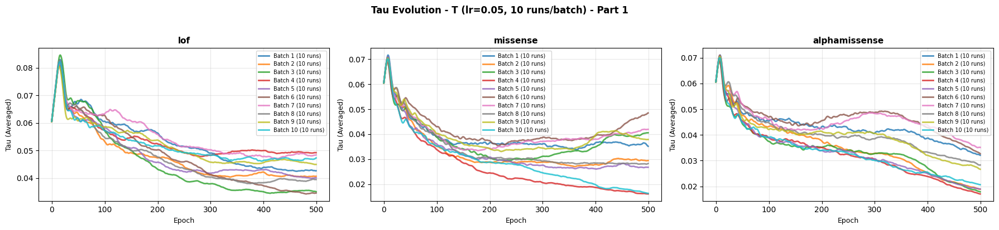

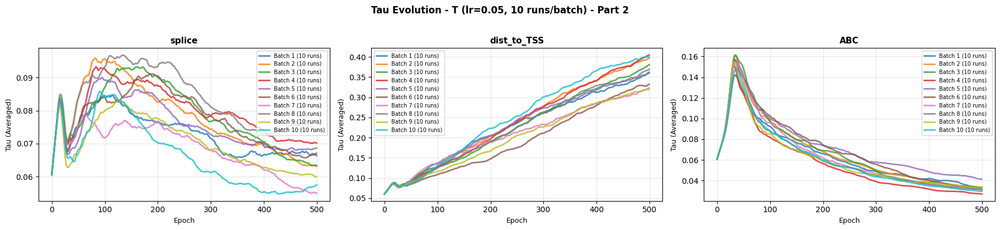

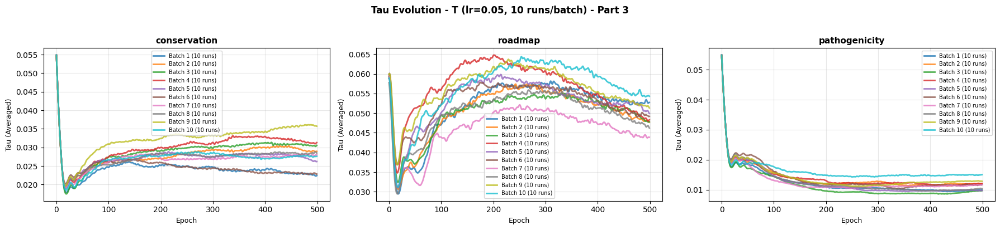

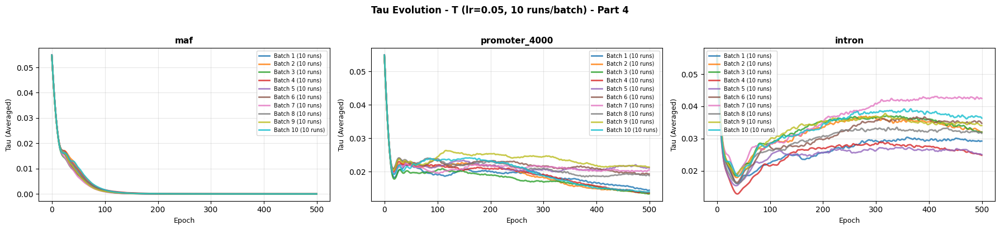

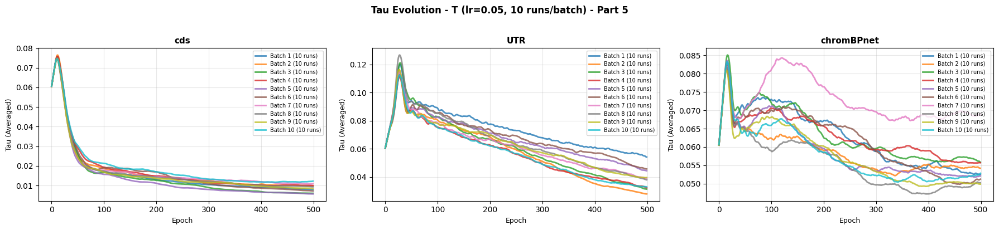

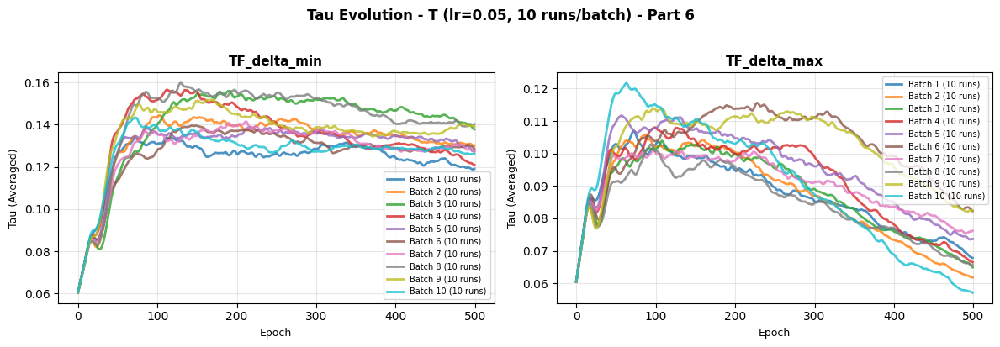


Processing NoT runs (batching by 50)


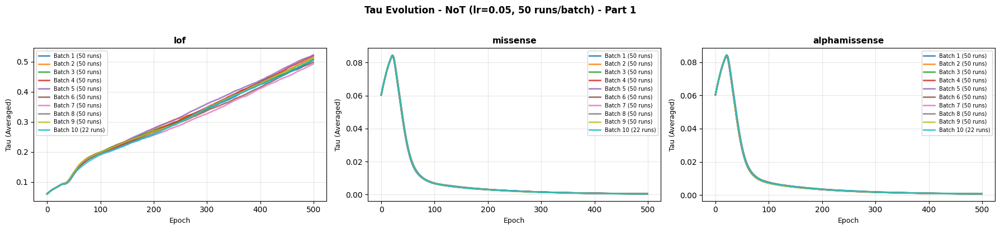

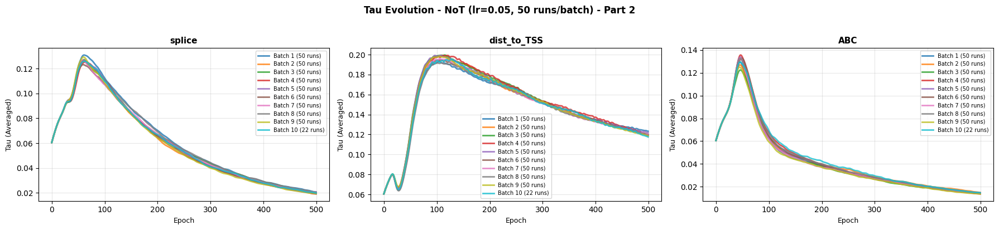

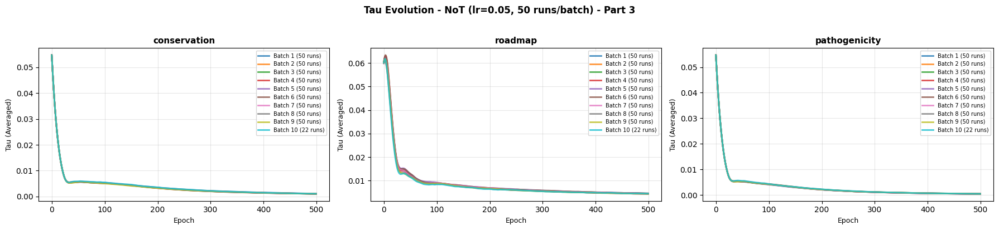

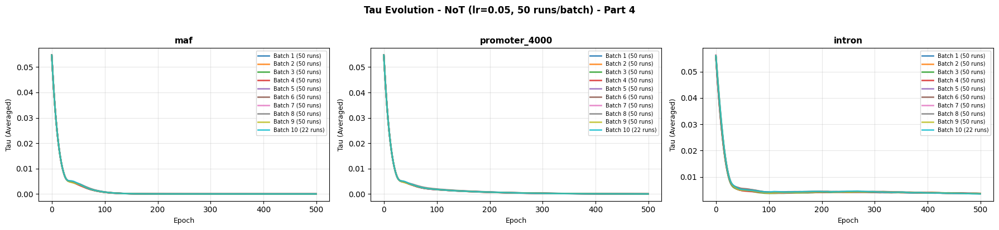

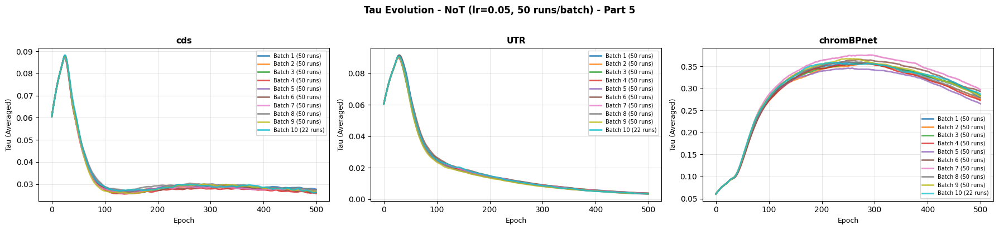

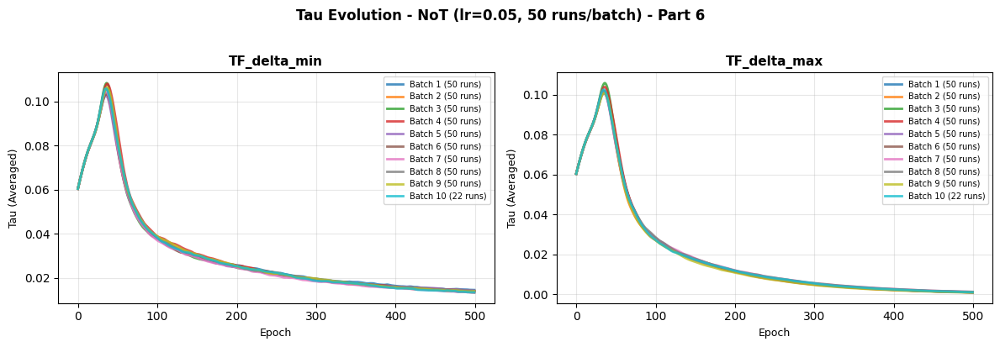

In [ ]:
# Load tau history from all runs and average across batches (T: 10 runs, NoT: 50 runs)
batch_sizes = {'T': 10, 'NoT': 50}
lr_dicts = {'T': lr_to_runs_T, 'NoT': lr_to_runs_NoT}

for run_type in ['T', 'NoT']:
    lr_dict = lr_dicts[run_type]
    if len(lr_dict) == 0:
        continue
    
    N = batch_sizes[run_type]
    print(f"\n{'='*80}")
    print(f"Processing {run_type} runs (batching by {N})")
    print(f"{'='*80}")
    
    for lr, run_ids in lr_dict.items():
        tau_history_data = {}
        missing_count = 0
        for run_id in run_ids:
            tau_hist = load_run_files(run_id, what=["tau_history"]).get("tau_history")
            if tau_hist is not None:
                # Load config to get metadata
                config_file = find_config_file(run_id)
                if config_file:
                    try:
                        with open(config_file, 'r') as f:
                            config = yaml.safe_load(f)
                        tau_hist['run_id'] = run_id
                        tau_hist['epoch'] = tau_hist.index
                        tau_hist['lr'] = config.get('lr', 'unknown')
                        tau_hist['epochs'] = config.get('epochs', 'unknown')
                        tau_history_data[run_id] = tau_hist
                    except Exception:
                        missing_count += 1
                else:
                    missing_count += 1
            else:
                missing_count += 1
        
        if missing_count > 0:
            print(f"Note: {missing_count} runs did not have tau_history files (out of {len(run_ids)} total runs)")

        if len(tau_history_data) == 0:
            print(f"No tau history data found for {run_type} runs with lr={lr}!")
            continue
        else:
            # Group runs into batches
            sorted_run_ids = sorted(tau_history_data.keys())
            run_to_batch = {run_id: i // N for i, run_id in enumerate(sorted_run_ids)}
            
            # Get all annotation names (assuming all runs have same annotations)
            first_run = list(tau_history_data.keys())[0]
            annotations = [col for col in tau_history_data[first_run].columns 
                        if col not in ['run_id', 'epoch', 'lr', 'epochs']]
            
            # Average tau history across runs in each batch
            batch_tau_history = {}
            for batch_num in sorted(set(run_to_batch.values())):
                runs_in_batch = [run_id for run_id, b in run_to_batch.items() if b == batch_num]
                if len(runs_in_batch) == 0:
                    continue
                
                # Get epochs (assuming all runs have same epochs)
                first_run_in_batch = runs_in_batch[0]
                epochs = tau_history_data[first_run_in_batch].index.values
                
                # Collect tau values for each epoch and annotation across runs in batch
                batch_avg = pd.DataFrame(index=epochs)
                batch_avg.index.name = 'epoch'
                
                for annotation in annotations:
                    annotation_values = []
                    for epoch in epochs:
                        epoch_values = []
                        for run_id in runs_in_batch:
                            tau_hist = tau_history_data[run_id]
                            if epoch in tau_hist.index:
                                epoch_values.append(tau_hist.loc[epoch, annotation])
                        if len(epoch_values) > 0:
                            annotation_values.append(np.mean(epoch_values))
                        else:
                            annotation_values.append(np.nan)
                    batch_avg[annotation] = annotation_values
                
                batch_avg = batch_avg.reset_index()
                batch_tau_history[batch_num] = batch_avg
            
            # Create batch labels
            batch_labels = {}
            for batch_num in sorted(batch_tau_history.keys()):
                runs_in_batch = [run_id for run_id, b in run_to_batch.items() if b == batch_num]
                batch_labels[batch_num] = f"Batch {batch_num+1} ({len(runs_in_batch)} runs)"
            
            # Faceted plot: 3 subplots per plot for easy copying to slides
            n_annotations = len(annotations)
            annotations_per_plot = 3
            
            # Create multiple plots, each with 3 subplots
            for plot_idx in range(0, n_annotations, annotations_per_plot):
                plot_annotations = annotations[plot_idx:plot_idx + annotations_per_plot]
                n_plots = len(plot_annotations)
                
                fig, axes = plt.subplots(1, n_plots, figsize=(6*n_plots, 4))
                if n_plots == 1:
                    axes = [axes]
                
                for subplot_idx, annotation in enumerate(plot_annotations):
                    ax = axes[subplot_idx]
                    for batch_num in sorted(batch_tau_history.keys()):
                        batch_data = batch_tau_history[batch_num]
                        ax.plot(batch_data['epoch'], batch_data[annotation], 
                            label=batch_labels[batch_num], alpha=0.8, linewidth=2)
                    ax.set_title(f'{annotation}', fontsize=11, fontweight='bold')
                    ax.set_xlabel('Epoch', fontsize=9)
                    ax.set_ylabel('Tau (Averaged)', fontsize=9)
                    ax.legend(loc='best', fontsize=7)
                    ax.grid(alpha=0.3)
                
                plt.suptitle(f'Tau Evolution - {run_type} (lr={lr}, {N} runs/batch) - Part {plot_idx//annotations_per_plot + 1}', 
                            fontsize=12, fontweight='bold', y=1.02)
                plt.tight_layout()
                plt.show()
      
        

   
    

In [7]:

def load_Z(genes, annotations_dir):
    Z_list = []   
    for gene in genes:
        path = os.path.join(annotations_dir, f"{gene}_annotations.tsv.gz")
        Z = pd.read_csv(path, sep = "\t")
        Z_list.append(Z)
    Zs = pd.concat(Z_list)
    Z = Zs.drop(['promoter_3000', 'promoter_2000'], axis=1, errors='ignore')
    log_cols = Z.filter(like="log_counts").columns
    Z["chromBPnet"] = Z[log_cols].max(axis=1)
    Z = Z.drop(columns=log_cols)
    
    enformer = Z.filter(like="TF_delta_min").columns
    Z["TF_delta_min"] = Z[enformer].max(axis=1)
    Z = Z.drop(columns=enformer)
    
    enformer = Z.filter(like="TF_delta_max").columns
    Z["TF_delta_max"] = Z[enformer].max(axis=1)
    Z = Z.drop(columns=enformer)
    return Z




Processing T runs (batching by 10)


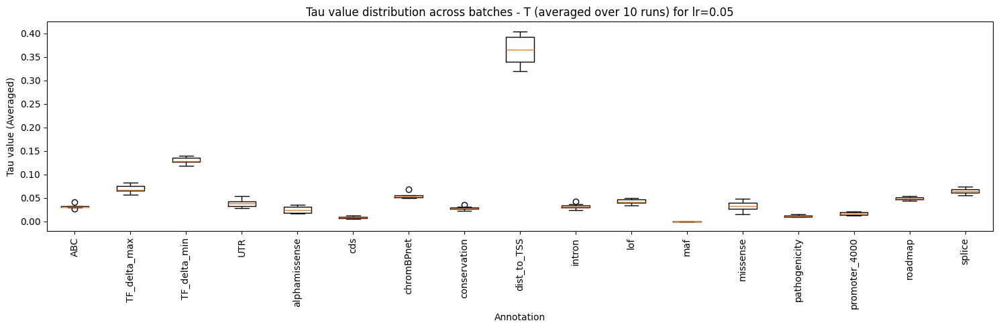

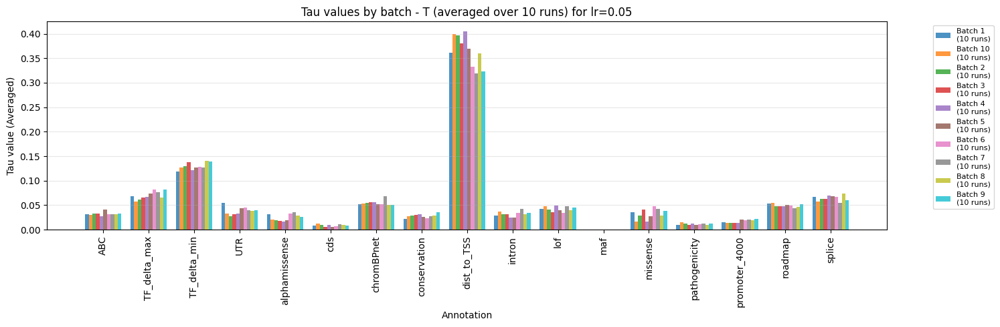


Processing NoT runs (batching by 50)


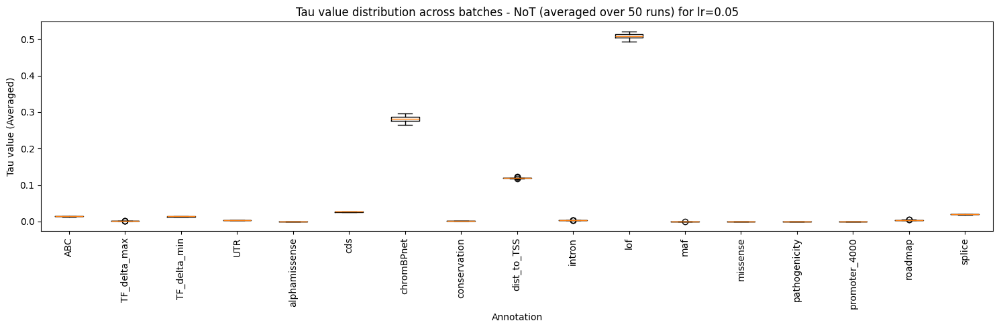

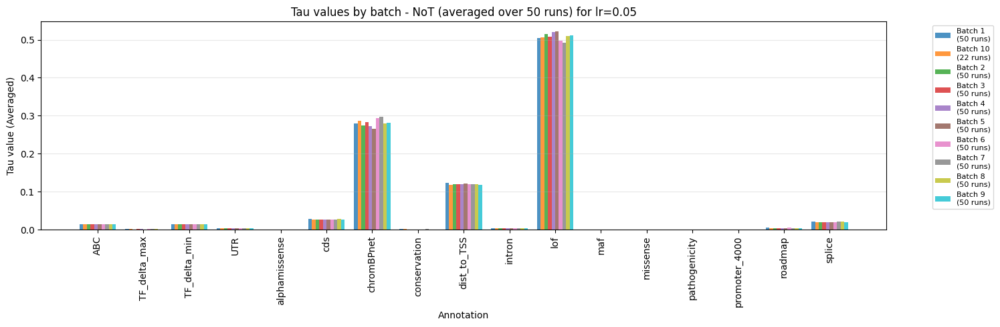

In [ ]:
# Final tau value distribution, averaged across batches (T: 10 runs, NoT: 50 runs)
batch_sizes = {'T': 10, 'NoT': 50}
lr_dicts = {'T': lr_to_runs_T, 'NoT': lr_to_runs_NoT}

for run_type in ['T', 'NoT']:
    lr_dict = lr_dicts[run_type]
    if len(lr_dict) == 0:
        continue
    
    N = batch_sizes[run_type]
    print(f"\n{'='*80}")
    print(f"Processing {run_type} runs (batching by {N})")
    print(f"{'='*80}")
    
    for lr, run_ids in lr_dict.items():
        # Group runs into batches
        sorted_run_ids = sorted(run_ids)
        run_to_batch = {run_id: i // N for i, run_id in enumerate(sorted_run_ids)}
        
        # Collect tau values by batch and annotation
        batch_annotation_taus = defaultdict(lambda: defaultdict(list))
        
        for run_id in run_ids:
            try:
                tau_T = load_run_files(run_id, what=["tau_T"]).get("tau_T")
                if tau_T is None:
                    continue
                batch_num = run_to_batch[run_id]
                for annotation in tau_T['Annotation']:
                    tau_value = tau_T[tau_T['Annotation'] == annotation]['Tau'].values[0]
                    batch_annotation_taus[batch_num][annotation].append(tau_value)
            except Exception as e:
                print(f"Warning: Could not load tau_T for {run_id}: {e}")
        
        # Average tau values across runs in each batch
        batch_avg_taus = {}
        for batch_num in sorted(batch_annotation_taus.keys()):
            batch_avg_taus[batch_num] = {}
            for annotation, tau_values in batch_annotation_taus[batch_num].items():
                batch_avg_taus[batch_num][annotation] = np.mean(tau_values)
        
        # Create batch labels
        batch_labels = {}
        for batch_num in sorted(batch_avg_taus.keys()):
            runs_in_batch = [run_id for run_id, b in run_to_batch.items() if b == batch_num]
            batch_labels[batch_num] = f"Batch {batch_num+1}\n({len(runs_in_batch)} runs)"
        
        # Convert to DataFrame for plotting
        annotation_list = sorted(set(ann for batch in batch_avg_taus.values() for ann in batch.keys()))
        tau_data = []
        for batch_num in sorted(batch_avg_taus.keys()):
            for annotation in annotation_list:
                if annotation in batch_avg_taus[batch_num]:
                    tau_data.append({
                        'batch': batch_labels[batch_num],
                        'annotation': annotation,
                        'tau': batch_avg_taus[batch_num][annotation]
                    })
        
        tau_df = pd.DataFrame(tau_data)
        
        # Plot tau value distribution as boxplot
        if len(tau_df) > 0:
            fig, ax = plt.subplots(figsize=(15, 5))
            
            annotations_unique = tau_df['annotation'].unique()
            positions = []
            data_for_boxplot = []
            labels = []
            
            for i, annotation in enumerate(sorted(annotations_unique)):
                annotation_data = tau_df[tau_df['annotation'] == annotation]['tau'].values
                if len(annotation_data) > 0:
                    positions.append(i + 1)
                    data_for_boxplot.append(annotation_data)
                    labels.append(annotation)
            
            bp = ax.boxplot(data_for_boxplot, positions=positions, tick_labels=labels)
            ax.set_title(f"Tau value distribution across batches - {run_type} (averaged over {N} runs) for lr={lr}")
            ax.set_xlabel("Annotation")
            ax.set_ylabel("Tau value (Averaged)")
            ax.tick_params(axis='x', rotation=90)
            plt.tight_layout()
            plt.show()
            
            # Also create a grouped bar plot showing each batch separately
            n_batches = len(tau_df['batch'].unique())
            if n_batches > 1:
                fig, ax = plt.subplots(figsize=(15, 5))
                x = np.arange(len(annotations_unique))
                width = 0.8 / n_batches
                
                for batch_idx, batch_label in enumerate(sorted(tau_df['batch'].unique())):
                    batch_data = tau_df[tau_df['batch'] == batch_label]
                    batch_tau_values = [batch_data[batch_data['annotation'] == ann]['tau'].values[0] 
                                       if len(batch_data[batch_data['annotation'] == ann]) > 0 else 0
                                       for ann in sorted(annotations_unique)]
                    offset = (batch_idx - n_batches/2 + 0.5) * width
                    ax.bar(x + offset, batch_tau_values, width, label=batch_label, alpha=0.8)
                
                ax.set_xlabel("Annotation")
                ax.set_ylabel("Tau value (Averaged)")
                ax.set_title(f"Tau values by batch - {run_type} (averaged over {N} runs) for lr={lr}")
                ax.set_xticks(x)
                ax.set_xticklabels(sorted(annotations_unique), rotation=90)
                ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
                ax.grid(alpha=0.3, axis='y')
                plt.tight_layout()
                plt.show()


    


In [ ]:
# distribution of tau values across runs, for different learning rates


In [8]:
# === New: utilities to handle parmigiano_joint experiments in seed_gene_results ===

import itertools

# Base directory for new parmigiano_joint runs
NEW_RESULTS_BASE = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/seed_gene_results"

# Any subdirectories starting with these prefixes are ignored (old minmax runs, etc.)
IGNORE_EXPERIMENT_PREFIXES = [
    "seed_genes_minmax_",
]


def list_joint_experiments(base_dir: str = NEW_RESULTS_BASE):
    """Return list of (experiment_name, experiment_path) for parmigiano_joint runs.

    An "experiment" is any immediate subdirectory of NEW_RESULTS_BASE that is not
    in the ignore list. Each experiment is expected to contain per-run folders
    like `run_1`, `run_2`, ... each with a `config.yaml` and output CSV/NPZ files.
    """
    exps = []
    if not os.path.exists(base_dir):
        return exps
    for name in sorted(os.listdir(base_dir)):
        path = os.path.join(base_dir, name)
        if not os.path.isdir(path):
            continue
        if any(name.startswith(pref) for pref in IGNORE_EXPERIMENT_PREFIXES):
            continue
        exps.append((name, path))
    return exps


def discover_joint_runs(base_dir: str = NEW_RESULTS_BASE):
    """Scan all experiments under `base_dir` and collect run-level metadata.

    Returns a DataFrame with one row per run and columns like:
    - experiment: experiment directory name
    - run_id: run directory name (e.g. run_1)
    - run_path: full path
    - lr, epochs, clip_norm, etc. when present in config.yaml
    """
    
    rows = []
    for exp_name, exp_path in list_joint_experiments(base_dir):
        for run_name in sorted(os.listdir(exp_path)):
            run_path = os.path.join(exp_path, run_name)
            if not os.path.isdir(run_path):
                continue
            if not run_name.startswith("run"):
                continue
            cfg_path = os.path.join(run_path, "config.yaml")
            cfg = None
            if os.path.exists(cfg_path):
                try:
                    with open(cfg_path, "r") as f:
                        cfg = yaml.safe_load(f)
                except Exception as e:
                    print(f"Warning: failed to read config for {run_path}: {e}")
            row = {
                "experiment": exp_name,
                "run_id": run_name,
                "run_path": run_path,
            }
            if cfg is not None:
                # Common hyperparameters we may want to group/plot by
                row["lr"] = cfg.get("lr")
                row["epochs"] = cfg.get("epochs")
                row["batch_size"] = cfg.get("batch_size")
                row["clip_norm"] = cfg.get("clip_norm")
            rows.append(row)
    if not rows:
        return pd.DataFrame()
    return pd.DataFrame(rows)


def load_joint_run_files(run_path: str, what=("tau_T", "tau_history", "r2_train", "r2_test", "losses")):
    """Load selected outputs for a single parmigiano_joint run given its path.

    This is similar to `load_run_files` above but works directly from an absolute
    run directory and does not rely on the older minmax directory layout.
    """
    
    result = {}

    def safe_load(file_path, loader, **kwargs):
        if os.path.exists(file_path):
            try:
                return loader(file_path, **kwargs)
            except Exception:
                return None
        return None

    if "losses" in what:
        result["losses"] = safe_load(os.path.join(run_path, "losses.txt"), pd.read_csv, header=None)
    if "tau_T" in what:
        result["tau_T"] = safe_load(os.path.join(run_path, "tau_T.csv"), pd.read_csv)
    if "tau_history" in what:
        result["tau_history"] = safe_load(os.path.join(run_path, "tau_history.csv"), pd.read_csv, index_col=0)
    if "r2_train" in what:
        result["r2_train"] = safe_load(os.path.join(run_path, "train_r2_scores.csv"), pd.read_csv)
    if "r2_test" in what:
        result["r2_test"] = safe_load(os.path.join(run_path, "test_r2_scores.csv"), pd.read_csv)
    return result


# === High-level plotting helpers ===


def plot_joint_tau_final_by_experiment(base_dir: str = NEW_RESULTS_BASE, max_runs_per_exp: int | None = None):
    """Plot final tau distribution (from tau_T.csv) per experiment.

    Each experiment gets its own subplot; within an experiment we pool Tau values
    across runs (optionally subsampling runs).
    """\
    
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    exps = sorted(runs_df["experiment"].unique())
    n_exp = len(exps)
    ncols = min(3, n_exp)
    nrows = int(np.ceil(n_exp / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)

    for idx, exp in enumerate(exps):
        ax = axes[idx // ncols][idx % ncols]
        sub = runs_df[runs_df["experiment"] == exp]
        if max_runs_per_exp is not None:
            sub = sub.head(max_runs_per_exp)
        all_tau = []
        for _, row in sub.iterrows():
            files = load_joint_run_files(row["run_path"], what=("tau_T",))
            tau_T = files.get("tau_T")
            if tau_T is None or "Tau" not in tau_T.columns:
                continue
            all_tau.append(tau_T["Tau"].values.astype(float))
        if not all_tau:
            ax.set_title(f"{exp} (no tau_T)")
            continue
        vals = np.concatenate(all_tau)
        ax.hist(vals, bins=30, alpha=0.8, color="steelblue", edgecolor="black")
        ax.set_title(f"{exp}: final tau distribution (N={len(vals)})")
        ax.set_xlabel("Tau")
        ax.set_ylabel("Count")

    # Hide any unused axes
    for j in range(idx + 1, nrows * ncols):
        fig.delaxes(axes[j // ncols][j % ncols])

    plt.tight_layout()
    plt.show()


def _stack_tau_history(df_history: pd.DataFrame) -> pd.DataFrame:
    """Utility to convert a tau_history DataFrame into long format.

    Assumes df_history has iterations as index and annotations as columns.
    Returns a DataFrame with columns: ["iteration", "annotation", "tau"].
    """\
    
    if df_history is None or df_history.empty:
        return pd.DataFrame(columns=["iteration", "annotation", "tau"])
    long = df_history.reset_index().melt(id_vars=df_history.index.name or "index",
                                         var_name="annotation",
                                         value_name="tau")
    long = long.rename(columns={df_history.index.name or "index": "iteration"})
    return long


def plot_joint_tau_trajectories(base_dir: str = NEW_RESULTS_BASE,
                                batch_size: int = 10,
                                max_batches_per_exp: int | None = None):
    """Plot tau trajectories over iterations, batched by `batch_size` runs.

    For each experiment, we:
    - order runs by name
    - group them into batches of size `batch_size`
    - within each batch, average tau across runs per iteration
    - plot the mean trajectory (optionally multiple batches per experiment)
    """
    
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    for exp in sorted(runs_df["experiment"].unique()):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        print("\n" + "=" * 80)
        print(f"Tau trajectories for experiment: {exp}")
        print("=" * 80)

        batches = [run_paths[i:i + batch_size] for i in range(0, len(run_paths), batch_size)]
        if max_batches_per_exp is not None:
            batches = batches[:max_batches_per_exp]

        plt.figure(figsize=(8, 5))
        for b_idx, batch in enumerate(batches):
            all_hist = []
            for run_path in batch:
                files = load_joint_run_files(run_path, what=("tau_history",))
                tau_hist = files.get("tau_history")
                if tau_hist is None or tau_hist.empty:
                    continue
                # average over annotations per iteration
                mean_over_ann = tau_hist.mean(axis=1)
                all_hist.append(mean_over_ann.values.astype(float))
            if not all_hist:
                continue
            arr = np.vstack(all_hist)
            mean_traj = arr.mean(axis=0)
            std_traj = arr.std(axis=0)
            iters = np.arange(len(mean_traj))
            label = f"batch {b_idx+1} (n={arr.shape[0]})"
            plt.plot(iters, mean_traj, label=label)
            plt.fill_between(iters, mean_traj - std_traj, mean_traj + std_traj,
                             alpha=0.2)

        plt.xlabel("Iteration")
        plt.ylabel("Mean tau across annotations")
        plt.title(f"Tau trajectories (batched by {batch_size}) - {exp}")
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_joint_r2_by_experiment(base_dir: str = NEW_RESULTS_BASE,
                                metric: str = "test",
                                aggregate: str = "final"):
    """Plot R2 summary for each experiment.

    Parameters
    ----------
    metric : {"train", "test"}
        Which R2 CSV to use (train_r2_scores.csv or test_r2_scores.csv).
    aggregate : {"final", "max", "mean"}
        How to aggregate over epochs within each run.
    """
    
    assert metric in {"train", "test"}
    assert aggregate in {"final", "max", "mean"}

    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    col = f"r2_{metric}"

    rows = []
    for _, row in runs_df.iterrows():
        files = load_joint_run_files(row["run_path"], what=(col,))
        r2 = files.get(col)
        if r2 is None or r2.empty:
            continue
        # expect columns like per-gene R2 over epochs; we average across genes
        # at each epoch, then aggregate over epochs as requested.
        # If there's an explicit epoch column, we ignore it and use numeric index.
        vals = r2.select_dtypes(include=[np.number])
        if vals.empty:
            continue
        mean_over_genes = vals.mean(axis=1).values.astype(float)
        if aggregate == "final":
            agg_value = mean_over_genes[-1]
        elif aggregate == "max":
            agg_value = float(mean_over_genes.max())
        else:  # mean
            agg_value = float(mean_over_genes.mean())
        rows.append({
            "experiment": row["experiment"],
            "run_id": row["run_id"],
            "agg_r2": agg_value,
        })

    if not rows:
        print("No R2 data found")
        return

    df = pd.DataFrame(rows)
    plt.figure(figsize=(8, 5))
    order = df.groupby("experiment")["agg_r2"].mean().sort_values(ascending=False).index
    pn_df = df.copy()
    pn_df["experiment"] = pd.Categorical(pn_df["experiment"], categories=order, ordered=True)
    p = (pn.ggplot(pn_df, pn.aes(x="experiment", y="agg_r2")) +
         pn.geom_boxplot(outlier_alpha=0.3) +
         pn.theme(axis_text_x=pn.element_text(rotation=45, ha="right")) +
         pn.labs(title=f"R2 ({metric}, {aggregate}) by experiment",
                 x="Experiment",
                 y=f"R2 ({metric}, {aggregate})"))
    print(p)


def plot_joint_learning_rates(base_dir: str = NEW_RESULTS_BASE):
    """Plot learning rate distribution per experiment (from config.yaml)."""\
    
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty or "lr" not in runs_df.columns:
        print("No learning rate information found in configs")
        return

    df = runs_df.dropna(subset=["lr"]).copy()
    if df.empty:
        print("No learning rate information found in configs")
        return

    plt.figure(figsize=(8, 5))
    for exp, sub in df.groupby("experiment"):
        plt.scatter([exp] * len(sub), sub["lr"].astype(float), alpha=0.7)
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Learning rate")
    plt.title("Learning rate per run and experiment (from config.yaml)")
    plt.grid(alpha=0.3, axis="y")
    plt.tight_layout()
    plt.show()



In [9]:
# === New analyses: per-annotation tau + R2 proportions, batched by 10 runs ===

# NOTE: these functions use the joint-run helpers and (for T experiments) the existing
# load_Z(...) function defined earlier in this notebook.


def _batch_runs_by_experiment(runs_df, batch_size=10):
    batches = []
    for exp in sorted(runs_df["experiment"].unique()):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        for i in range(0, len(run_paths), batch_size):
            batch = run_paths[i:i + batch_size]
            if batch:
                batches.append((exp, len(batches), batch))
    return batches


def plot_tau_trajectories_per_annotation_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
    annotations=None
):
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    for exp in sorted(runs_df["experiment"].unique()):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        # Get list of annotation columns from first run with tau_history
        cols = None
        for rp in run_paths:
            files = load_joint_run_files(rp, what=("tau_history",))
            th = files.get("tau_history")
            if th is not None and not th.empty:
                cols = list(th.columns)
                break
        if cols is None:
            continue

        if annotations is None:
            ann_list = cols
        else:
            ann_list = [a for a in annotations if a in cols]
        if not ann_list:
            continue

        # Batches of runs for this experiment
        batches = [run_paths[i:i + batch_size] for i in range(0, len(run_paths), batch_size)]

        for ann in ann_list:
            plt.figure(figsize=(8, 5))
            for b_idx, batch in enumerate(batches):
                trajs = []
                for rp in batch:
                    files = load_joint_run_files(rp, what=("tau_history",))
                    th = files.get("tau_history")
                    if th is None or ann not in th.columns:
                        continue
                    vals = th[ann].values.astype(float)
                    trajs.append(vals)
                if not trajs:
                    continue
                arr = np.vstack(trajs)  # (runs, iters)
                mean_traj = arr.mean(axis=0)
                iters = np.arange(len(mean_traj))
                plt.plot(
                    iters,
                    mean_traj,
                    label=f"batch {b_idx+1} (n={arr.shape[0]})",
                )
            plt.xlabel("Iteration")
            plt.ylabel(f"Tau ({ann})")
            plt.title(f"Tau trajectories for {ann} – {exp} (batched by {batch_size} runs)")
            plt.grid(alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

def plot_final_tau_hist_per_annotation_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
    annotations=None,
    max_annotations=40,
):
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    for exp in sorted(runs_df["experiment"].unique()):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        # Collect per-run final tau per annotation
        per_run_records = []
        for rp in run_paths:
            files = load_joint_run_files(rp, what=("tau_T",))
            tau_T = files.get("tau_T")
            if tau_T is None or tau_T.empty:
                continue
            for _, row in tau_T.iterrows():
                ann = row["Annotation"]
                if annotations is not None and ann not in annotations:
                    continue
                per_run_records.append({
                    "annotation": ann,
                    "run_path": rp,
                    "tau": float(row["Tau"]),
                })
        if not per_run_records:
            continue

        df_runs = pd.DataFrame(per_run_records)
        ann_order = sorted(df_runs["annotation"].unique())
        if annotations is None:
            ann_order = ann_order[: min(max_annotations, len(ann_order))]
        df_runs = df_runs[df_runs["annotation"].isin(ann_order)]

        # 1. Mean final tau across ALL runs per annotation
        mean_all = (
            df_runs.groupby("annotation")["tau"]
            .mean()
            .reindex(ann_order)
        )
        plt.figure(figsize=(max(6, len(ann_order) * 0.4), 4))
        plt.bar(np.arange(len(ann_order)), mean_all.values, color="steelblue")
        plt.xticks(np.arange(len(ann_order)), ann_order, rotation=90)
        plt.ylabel("Mean final tau (all runs)")
        plt.title(f"Final tau per annotation – {exp}")
        plt.tight_layout()
        plt.show()

        # 2. Boxplot: per-batch mean final tau per annotation
        batches = [run_paths[i:i + batch_size] for i in range(0, len(run_paths), batch_size)]
        batch_records = []
        for b_idx, batch in enumerate(batches):
            sub_batch = df_runs[df_runs["run_path"].isin(batch)]
            if sub_batch.empty:
                continue
            grp = sub_batch.groupby("annotation")["tau"].mean()
            for ann, val in grp.items():
                batch_records.append({
                    "annotation": ann,
                    "batch": b_idx + 1,
                    "tau": float(val),
                })
        if not batch_records:
            continue
        df_batches = pd.DataFrame(batch_records)
        plt.figure(figsize=(max(6, len(ann_order) * 0.4), 4))
        data = [df_batches[df_batches["annotation"] == ann]["tau"].values for ann in ann_order]
        plt.boxplot(data, labels=ann_order, showfliers=True)
        plt.xticks(rotation=90)
        plt.ylabel(f"Mean final tau per batch (size {batch_size})")
        plt.title(f"Final tau per annotation – batched – {exp}")
        plt.tight_layout()
        plt.show()

def plot_r2_proportions_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
    thresholds=(0.1, 0.01),
):
    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    rows = []
    for _, row in runs_df.iterrows():
        rp = row["run_path"]
        files = load_joint_run_files(rp, what=("r2_train", "r2_test"))
        for split in ("train", "test"):
            r2 = files.get(f"r2_{split}")
            if r2 is None or r2.empty:
                continue
            vals = r2.select_dtypes(include=[np.number])
            if vals.empty:
                continue
            final = vals.iloc[-1].values.astype(float)
            n = len(final)
            entry = {
                "experiment": row["experiment"],
                "run_id": row["run_id"],
                "split": split,
            }
            for thr in thresholds:
                entry[f"prop_gt_{thr}"] = float((final > thr).sum() / n)
            rows.append(entry)

    if not rows:
        print("No R2 data found")
        return

    df = pd.DataFrame(rows)
    for exp in sorted(df["experiment"].unique()):
        df_exp = df[df["experiment"] == exp]
        for split in ("train", "test"):
            sub = df_exp[df_exp["split"] == split].copy()
            if sub.empty:
                continue
            sub = sub.sort_values("run_id")
            rids = list(sub["run_id"].unique())
            batches = []
            for i in range(0, len(rids), batch_size):
                batch_ids = rids[i:i + batch_size]
                batches.append((len(batches), batch_ids))
            records = []
            for b_idx, batch_ids in batches:
                bsub = sub[sub["run_id"].isin(batch_ids)]
                if bsub.empty:
                    continue
                rec = {"batch": b_idx + 1, "n_runs": bsub["run_id"].nunique()}
                for thr in thresholds:
                    rec[f"prop_gt_{thr}"] = float(bsub[f"prop_gt_{thr}"].mean())
                records.append(rec)
            if not records:
                continue
            bdf = pd.DataFrame(records)
            plt.figure(figsize=(8, 4))
            x = np.arange(len(bdf))
            width = 0.35
            for j, thr in enumerate(thresholds):
                plt.bar(x + j * width, bdf[f"prop_gt_{thr}"], width=width, label=f"> {thr}")
            labels = [f"B{r['batch']} (n={r['n_runs']})" for _, r in bdf.iterrows()]
            plt.xticks(x + width * (len(thresholds) - 1) / 2, labels)
            plt.ylim(0, 1)
            plt.ylabel("Proportion of genes")
            plt.title(f"R2 proportions by batch ({split}) – {exp}")
            plt.grid(alpha=0.3, axis="y")
            plt.legend()
            plt.tight_layout()
            plt.show()


# === Override: summarize_T_variants_kept_and_annotation_taus with double-averaging ===

def summarize_T_variants_kept_and_annotation_taus(
    base_dir: str = NEW_RESULTS_BASE,
    batch_size: int = 10,
    annotation_filter: list[str] | None = None,
):
    """
    For T experiments: overall kept proportion and per-annotation kept vs not-kept.

    - Proportion kept: computed per batch, then aggregated across batches.
    - Annotation values: double average
      (mean within run, then within batch of 10 runs, then across all batches).

    Relies on `load_Z(genes, annotations_dir)` being defined earlier in the notebook.
    """
    if "load_Z" not in globals():
        raise RuntimeError(
            "load_Z(genes, annotations_dir) must be defined before calling this function."
        )

    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    # Heuristic: T experiments contain 'T' but not 'NoT' in their name
    T_exps = [e for e in runs_df["experiment"].unique()
              if ("NoT" not in e)]
    if not T_exps:
        print("No T experiments detected (by name heuristic)")
        return

    for exp in sorted(T_exps):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        print("\n" + "=" * 80)
        print(f"T experiment: {exp}")
        print("=" * 80)

        batches = [run_paths[i:i + batch_size] for i in range(0, len(run_paths), batch_size)]

        # Accumulate per-batch kept proportions and per-batch per-annotation means
        all_batch_kept_props: list[float] = []
        exp_ann_batch_means_kept: dict[str, list[float]] = {}
        exp_ann_batch_means_not: dict[str, list[float]] = {}

        for b_idx, batch in enumerate(batches):
            batch_kept_props: list[float] = []
            # Per-run means inside this batch
            batch_run_means_kept: dict[str, list[float]] = {}
            batch_run_means_not: dict[str, list[float]] = {}

            for rp in batch:
                cfg_path = os.path.join(rp, "config.yaml")
                if not os.path.exists(cfg_path):
                    continue
                try:
                    with open(cfg_path, "r") as f:
                        cfg = yaml.safe_load(f)
                except Exception:
                    continue

                genes = cfg.get("genes")
                annotations_dir = cfg.get("annotation_dir")
                files = load_joint_run_files(rp, what=("tau_T",))
                tau_T = files.get("tau_T")
                if tau_T is None or tau_T.empty or genes is None or annotations_dir is None:
                    continue

                Z = load_Z(genes, annotations_dir)
                ann_list = list(tau_T["Annotation"])
                # Ensure all annotations exist in Z
                ann_list = [a for a in ann_list if a in Z.columns]
                if not ann_list:
                    continue

                Z_sub = Z[ann_list].copy()
                tau_vec = tau_T.set_index("Annotation")["Tau"].loc[ann_list].values.astype(float)
                Z["parmigiano"] = Z_sub.values @ tau_vec
                thr = float(tau_T["Filter Threshold"].iloc[0])
                kept_mask = (Z["parmigiano"] >= thr).values
                batch_kept_props.append(float(kept_mask.mean()))

                # Per-run, per-annotation mean of Z[ann] for kept vs not-kept
                for ann in ann_list:
                    if annotation_filter is not None and ann not in annotation_filter:
                        continue
                    vals = Z_sub[ann].values.astype(float)
                    v_k = vals[kept_mask]
                    v_n = vals[~kept_mask]
                    if v_k.size:
                        batch_run_means_kept.setdefault(ann, []).append(float(v_k.mean()))
                    if v_n.size:
                        batch_run_means_not.setdefault(ann, []).append(float(v_n.mean()))

            if not batch_kept_props:
                continue

            # Batch-level kept proportion
            batch_kept_mean = float(np.mean(batch_kept_props))
            all_batch_kept_props.append(batch_kept_mean)

            # Batch-level per-annotation means (kept / not)
            for ann, vals in batch_run_means_kept.items():
                if not vals:
                    continue
                exp_ann_batch_means_kept.setdefault(ann, []).append(float(np.mean(vals)))
            for ann, vals in batch_run_means_not.items():
                if not vals:
                    continue
                exp_ann_batch_means_not.setdefault(ann, []).append(float(np.mean(vals)))

        if not all_batch_kept_props:
            continue

        print(
            f"Overall across batches: mean kept={np.mean(all_batch_kept_props):.2%} "
            f"± {np.std(all_batch_kept_props):.2%} (n_batches={len(all_batch_kept_props)})"
        )

        # Double-averaged per-annotation means
        if not exp_ann_batch_means_kept:
            continue

        annotations = sorted(exp_ann_batch_means_kept.keys())
        x = np.arange(len(annotations))
        width = 0.35

        kept_means = []
        kept_stds = []
        not_means = []
        not_stds = []
        for ann in annotations:
            k_vals = np.array(exp_ann_batch_means_kept.get(ann, []), dtype=float)
            n_vals = np.array(exp_ann_batch_means_not.get(ann, []), dtype=float)
            kept_means.append(k_vals.mean() if k_vals.size else np.nan)
            kept_stds.append(k_vals.std() if k_vals.size else 0.0)
            not_means.append(n_vals.mean() if n_vals.size else np.nan)
            not_stds.append(n_vals.std() if n_vals.size else 0.0)

        plt.figure(figsize=(max(6, len(annotations) * 0.4), 4))
        plt.bar(
            x - width / 2, kept_means, width=width, yerr=kept_stds,
            label="kept", color="tab:blue", alpha=0.8, capsize=4,
        )
        plt.bar(
            x + width / 2, not_means, width=width, yerr=not_stds,
            label="not kept", color="tab:orange", alpha=0.8, capsize=4,
        )
        plt.xticks(x, annotations, rotation=90)
        plt.ylabel("Double-averaged annotation value")
        plt.title(
            f"Annotation values (kept vs not-kept) – {exp}\n"
            "(mean within run, then within batch, then across batches)"
        )
        plt.legend()
        plt.tight_layout()
        plt.show()


# === Override: summarize_T_variants_kept_and_annotation_taus with double-averaging ===

def summarize_T_variants_kept_and_annotation_taus(
    base_dir: str = NEW_RESULTS_BASE,
    batch_size: int = 10,
    annotation_filter: list[str] | None = None,
):
    """
    For T experiments: overall kept proportion and per-annotation kept vs not-kept.

    - Proportion kept: computed per batch, then aggregated across batches.
    - Annotation values: double average
      (mean within run, then within batch of 10 runs, then across all batches).

    Relies on `load_Z(genes, annotations_dir)` being defined earlier in the notebook.
    """
    if "load_Z" not in globals():
        raise RuntimeError(
            "load_Z(genes, annotations_dir) must be defined before calling this function."
        )

    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    # Heuristic: T experiments contain 'T' but not 'NoT' in their name
    T_exps = [e for e in runs_df["experiment"].unique()
              if ("noT" not in e)]
    if not T_exps:
        print("No T experiments detected (by name heuristic)")
        return

    for exp in sorted(T_exps):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        print("\n" + "=" * 80)
        print(f"T experiment: {exp}")
        print("=" * 80)

        batches = [run_paths[i:i + batch_size] for i in range(0, len(run_paths), batch_size)]

        # Accumulate per-batch kept proportions and per-batch per-annotation means
        all_batch_kept_props: list[float] = []
        exp_ann_batch_means_kept: dict[str, list[float]] = {}
        exp_ann_batch_means_not: dict[str, list[float]] = {}

        for b_idx, batch in enumerate(batches):
            batch_kept_props: list[float] = []
            # Per-run means inside this batch
            batch_run_means_kept: dict[str, list[float]] = {}
            batch_run_means_not: dict[str, list[float]] = {}

            for rp in batch:
                cfg_path = os.path.join(rp, "config.yaml")
                if not os.path.exists(cfg_path):
                    continue
                try:
                    with open(cfg_path, "r") as f:
                        cfg = yaml.safe_load(f)
                except Exception:
                    continue

                genes = cfg.get("genes")
                annotations_dir = cfg.get("annotation_dir")
                files = load_joint_run_files(rp, what=("tau_T",))
                tau_T = files.get("tau_T")
                if tau_T is None or tau_T.empty or genes is None or annotations_dir is None:
                    continue

                Z = load_Z(genes, annotations_dir)
                ann_list = list(tau_T["Annotation"])
                # Ensure all annotations exist in Z
                ann_list = [a for a in ann_list if a in Z.columns]
                if not ann_list:
                    continue

                Z_sub = Z[ann_list].copy()
                tau_vec = tau_T.set_index("Annotation")["Tau"].loc[ann_list].values.astype(float)
                Z["parmigiano"] = Z_sub.values @ tau_vec
                thr = float(tau_T["Filter Threshold"].iloc[0])
                kept_mask = (Z["parmigiano"] >= thr).values
                batch_kept_props.append(float(kept_mask.mean()))

                # Per-run, per-annotation mean of Z[ann] for kept vs not-kept
                for ann in ann_list:
                    if annotation_filter is not None and ann not in annotation_filter:
                        continue
                    vals = Z_sub[ann].values.astype(float)
                    v_k = vals[kept_mask]
                    v_n = vals[~kept_mask]
                    if v_k.size:
                        batch_run_means_kept.setdefault(ann, []).append(float(v_k.mean()))
                    if v_n.size:
                        batch_run_means_not.setdefault(ann, []).append(float(v_n.mean()))

            if not batch_kept_props:
                continue

            # Batch-level kept proportion
            batch_kept_mean = float(np.mean(batch_kept_props))
            all_batch_kept_props.append(batch_kept_mean)

            # Batch-level per-annotation means (kept / not)
            for ann, vals in batch_run_means_kept.items():
                if not vals:
                    continue
                exp_ann_batch_means_kept.setdefault(ann, []).append(float(np.mean(vals)))
            for ann, vals in batch_run_means_not.items():
                if not vals:
                    continue
                exp_ann_batch_means_not.setdefault(ann, []).append(float(np.mean(vals)))

        if not all_batch_kept_props:
            continue

        print(
            f"Overall across batches: mean kept={np.mean(all_batch_kept_props):.2%} "
            f"± {np.std(all_batch_kept_props):.2%} (n_batches={len(all_batch_kept_props)})"
        )

        # Double-averaged per-annotation means
        if not exp_ann_batch_means_kept:
            continue

        annotations = sorted(exp_ann_batch_means_kept.keys())
        x = np.arange(len(annotations))
        width = 0.35

        kept_means = []
        kept_stds = []
        not_means = []
        not_stds = []
        for ann in annotations:
            k_vals = np.array(exp_ann_batch_means_kept.get(ann, []), dtype=float)
            n_vals = np.array(exp_ann_batch_means_not.get(ann, []), dtype=float)
            kept_means.append(k_vals.mean() if k_vals.size else np.nan)
            kept_stds.append(k_vals.std() if k_vals.size else 0.0)
            not_means.append(n_vals.mean() if n_vals.size else np.nan)
            not_stds.append(n_vals.std() if n_vals.size else 0.0)

        plt.figure(figsize=(max(6, len(annotations) * 0.4), 4))
        plt.bar(
            x - width / 2, kept_means, width=width, yerr=kept_stds,
            label="kept", color="tab:blue", alpha=0.8, capsize=4,
        )
        plt.bar(
            x + width / 2, not_means, width=width, yerr=not_stds,
            label="not kept", color="tab:orange", alpha=0.8, capsize=4,
        )
        plt.xticks(x, annotations, rotation=90)
        plt.ylabel("Double-averaged annotation value")
        plt.title(
            f"Annotation values (kept vs not-kept) – {exp}\n"
            "(mean within run, then within batch, then across batches)"
        )
        plt.legend()
        plt.tight_layout()
        plt.show()



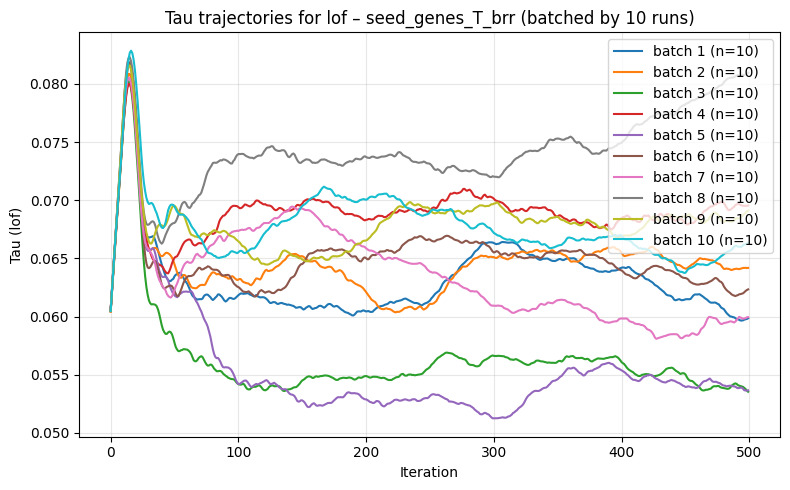

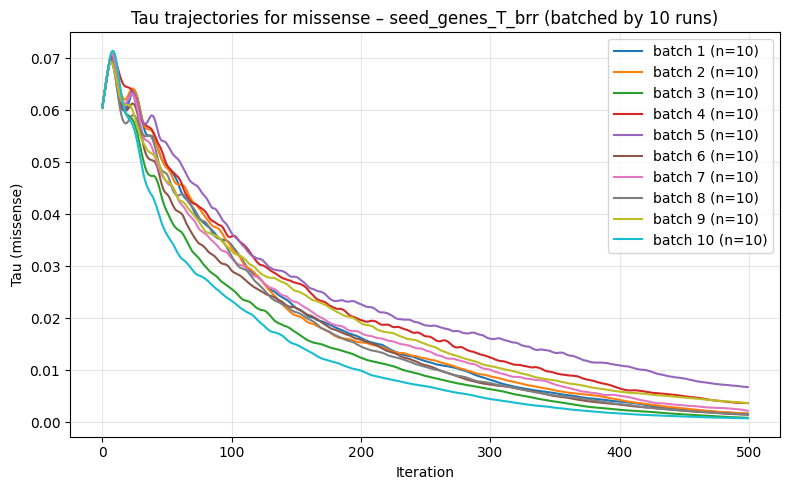

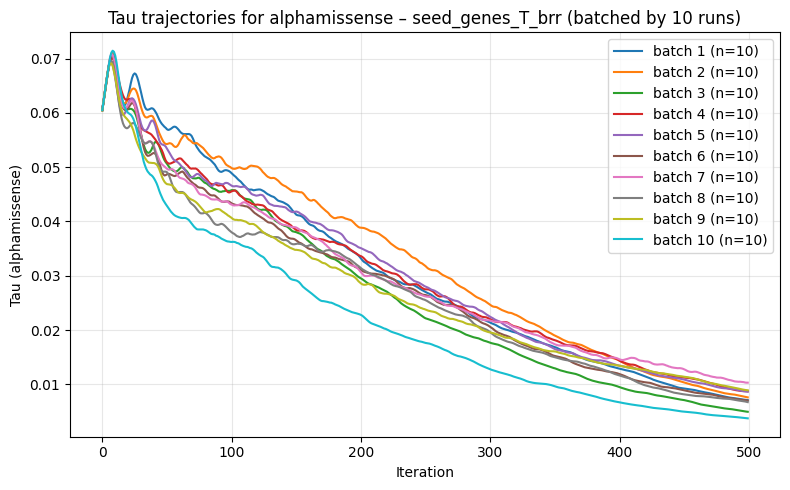

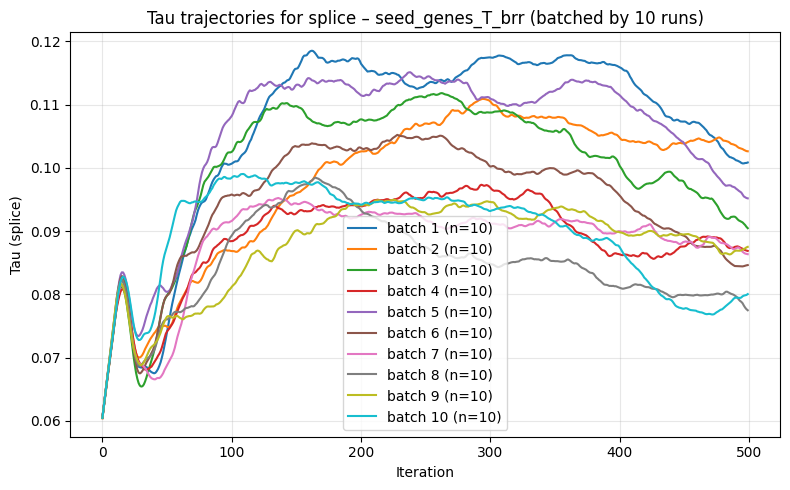

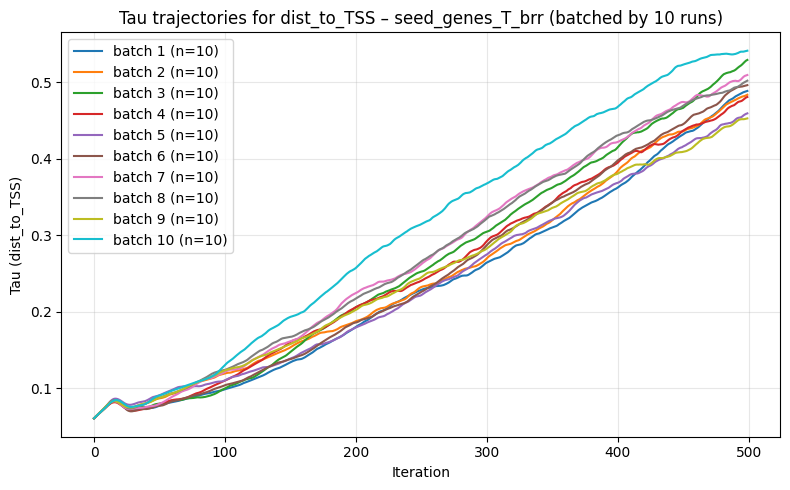

...

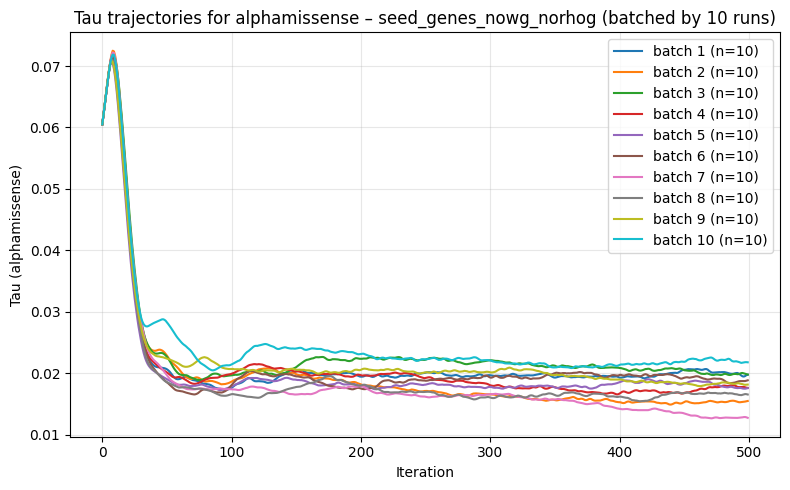

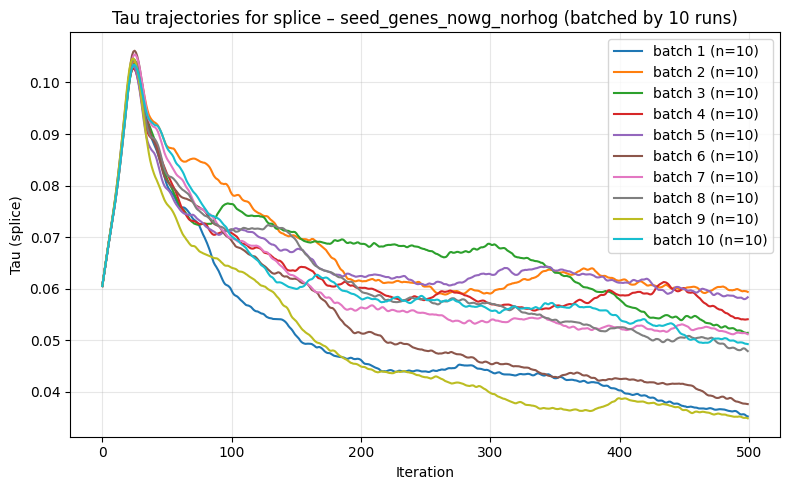

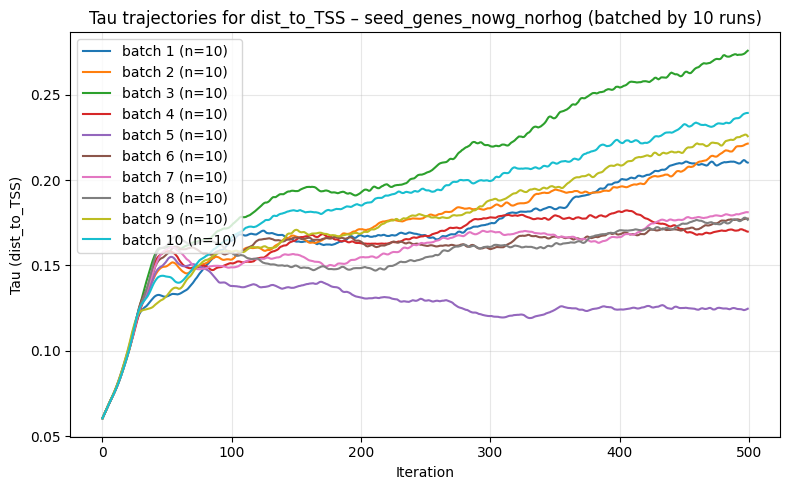

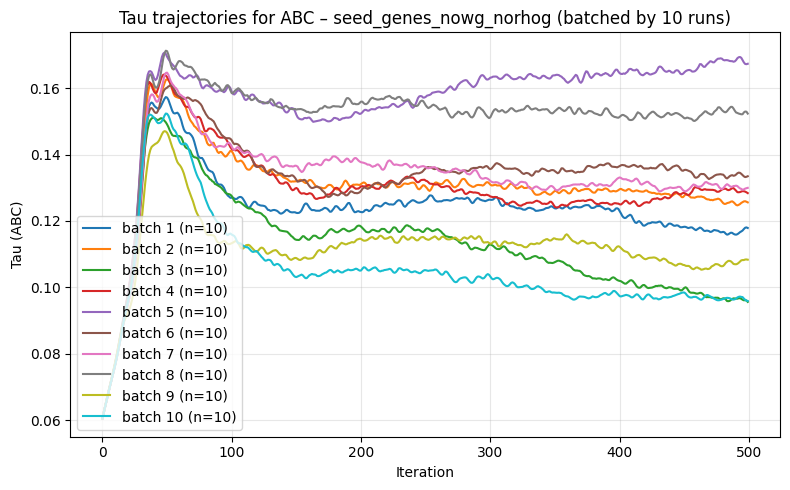

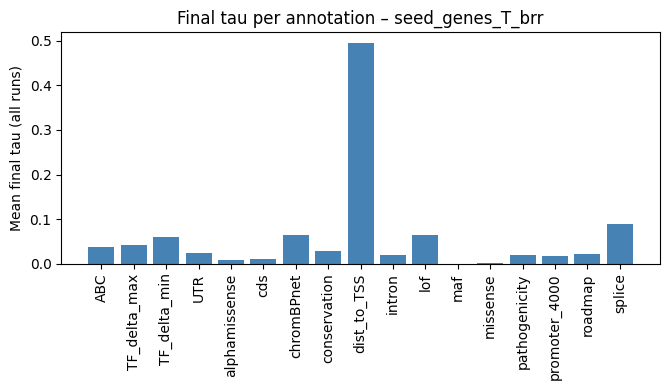

/scratch/ipykernel_3573555/998082072.py:161: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.


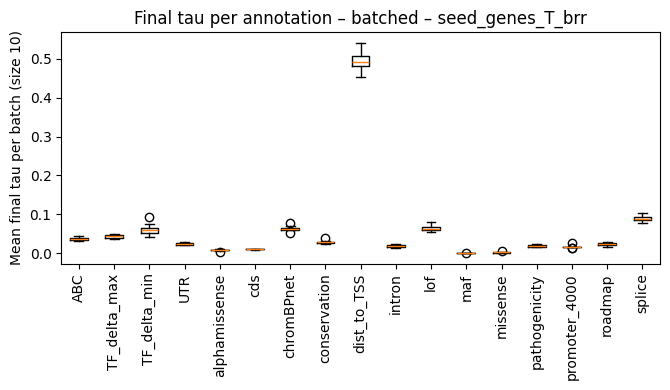

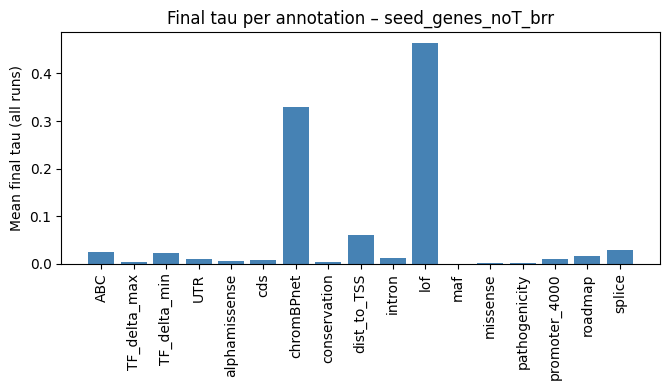

/scratch/ipykernel_3573555/998082072.py:161: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.


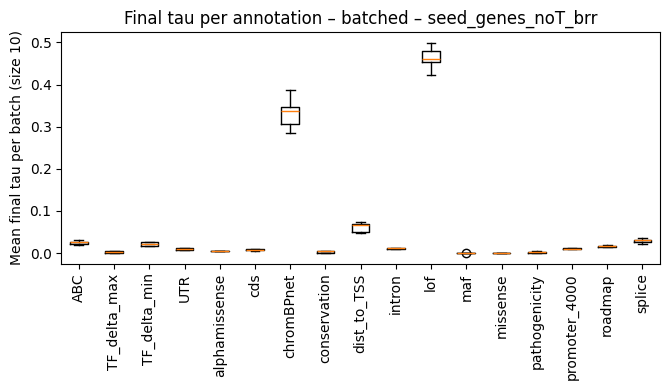

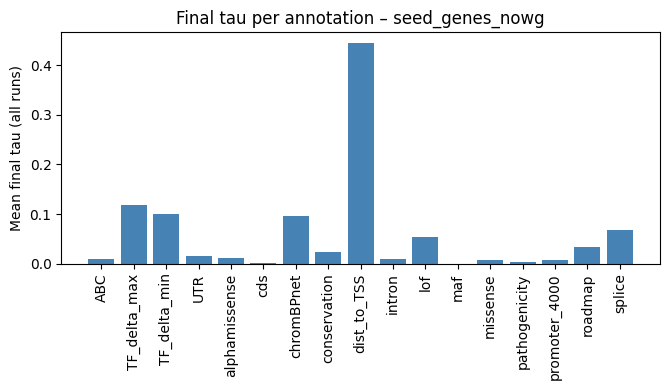

/scratch/ipykernel_3573555/998082072.py:161: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.


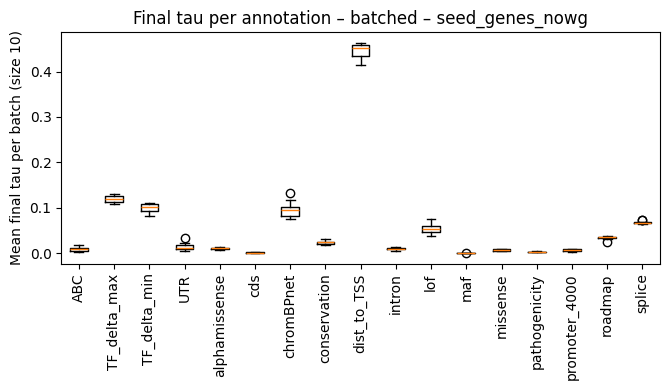

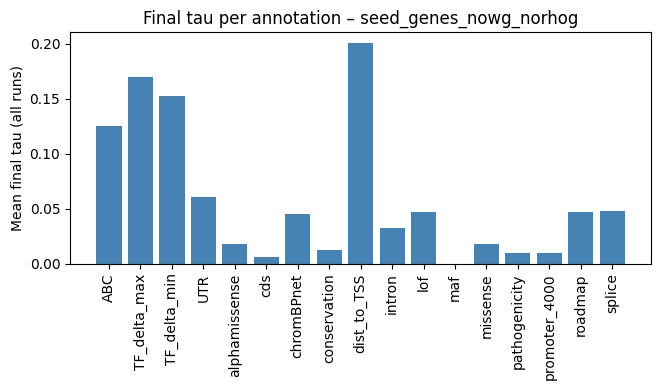

/scratch/ipykernel_3573555/998082072.py:161: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.


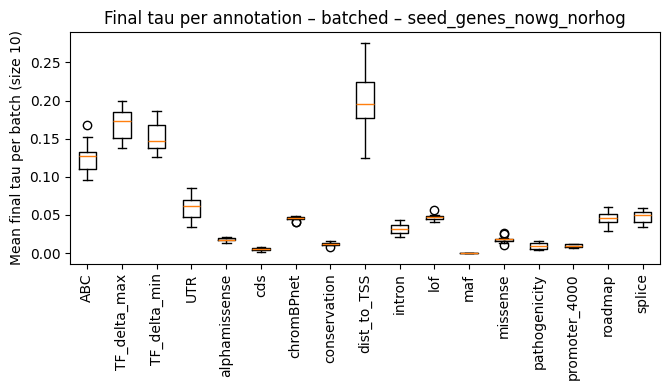

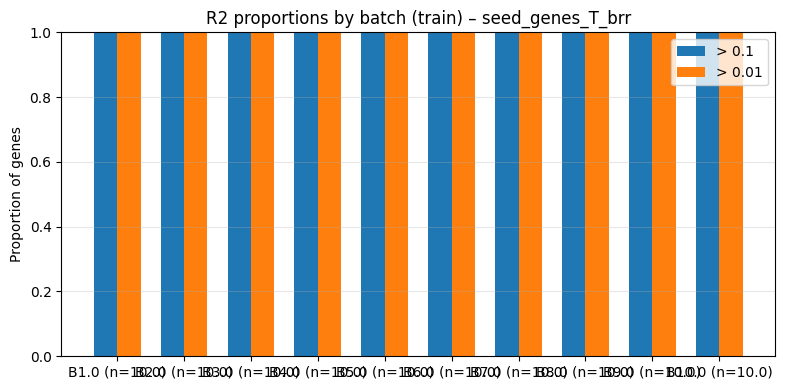

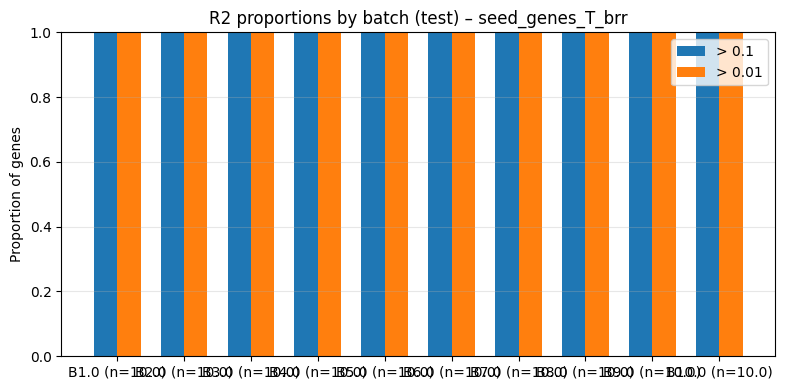

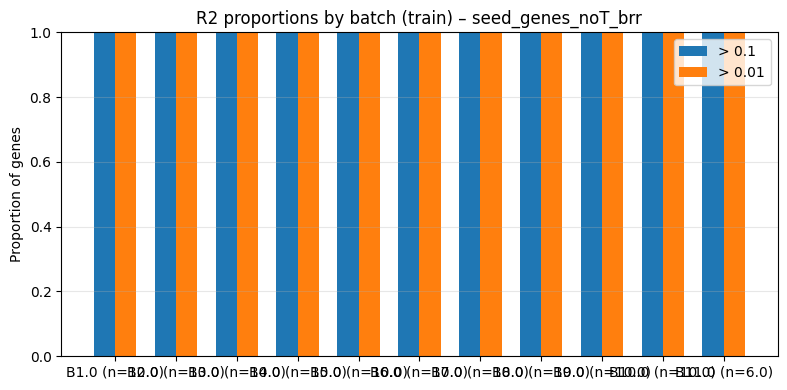

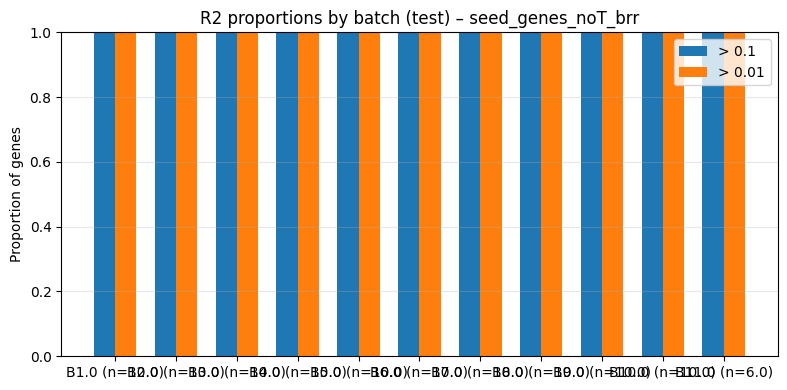

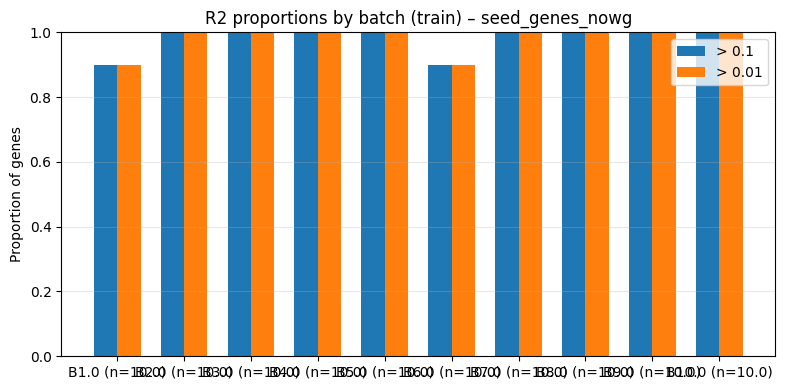

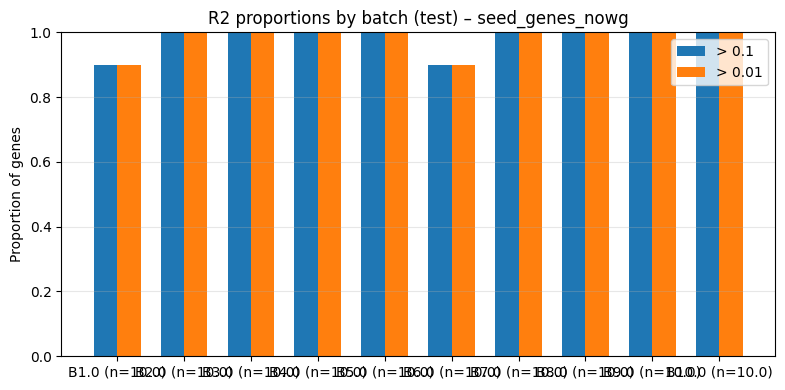

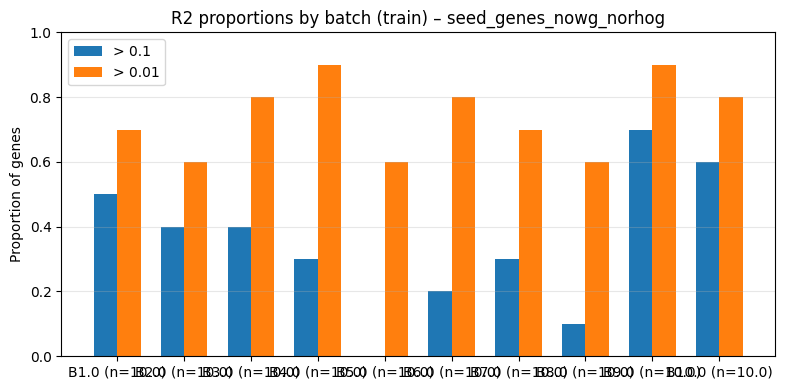

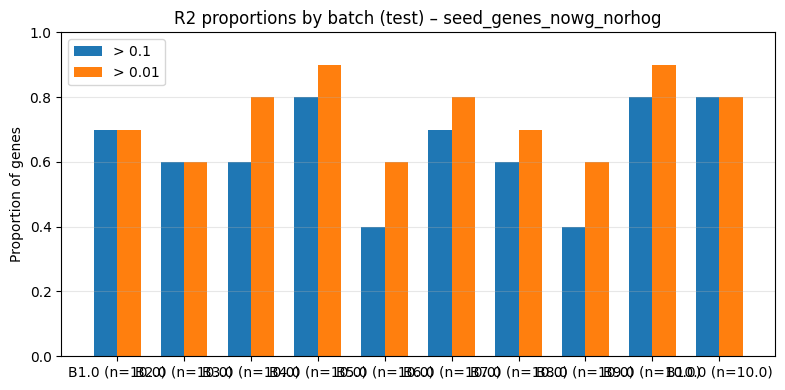


T experiment: seed_genes_T_brr
Overall across batches: mean kept=88.01% ± 4.22% (n_batches=10)


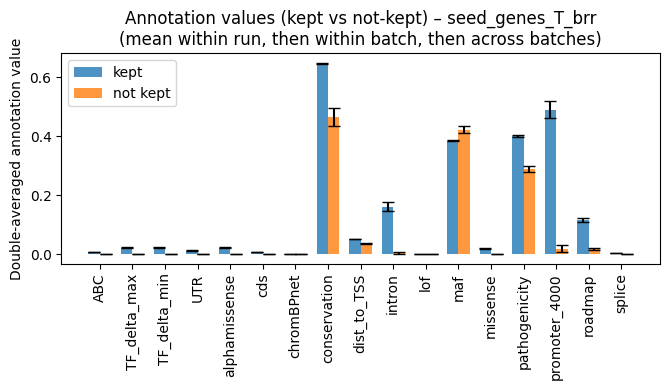


T experiment: seed_genes_noT_brr
Overall across batches: mean kept=98.73% ± 1.17% (n_batches=11)


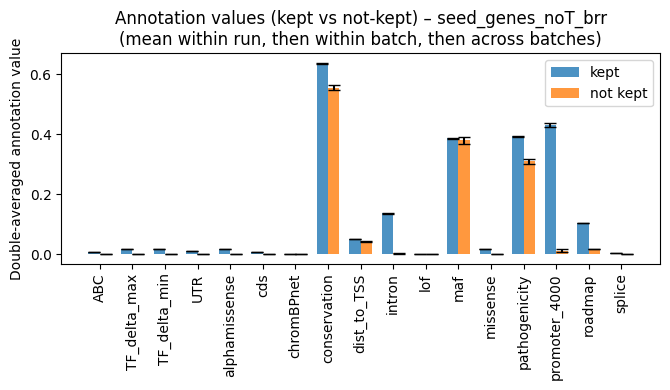

In [ ]:
# === Convenience cell: run all parmigiano_joint plots (updated) ===

# Tau trajectories per annotation, batched by 10 runs
plot_tau_trajectories_per_annotation_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
)

# Final tau histogram per annotation, batched by 10 runs
plot_final_tau_hist_per_annotation_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
)

# R2 proportions > 0.1 and > 0.01, Train/Test, batched by 10 runs
plot_r2_proportions_batched(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
    thresholds=(0.1, 0.01),
)

# T experiments: variants kept + per-annotation tau distributions (kept vs not)
# (experiments with no "NoT" in the name)
summarize_T_variants_kept_and_annotation_taus(
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
)

In [ ]:
# === T experiments: majority-rule kept vs not-kept, plus variant instability ===

def summarize_T_majority_kept_and_annotation_distributions(
    base_dir: str = NEW_RESULTS_BASE,
    annotation_filter: list[str] | None = None,
):
    """
    For each T experiment:

    - Uses ALL runs in the experiment.
    - For each run r:
        * compute parmigiano_r = Z @ tau_r
        * kept_r[i] = 1{parmigiano_r[i] >= T_r}
    - For each variant i:
        * k_i = fraction of runs where kept_r[i] == 1
        * majority-kept if k_i >= 0.5, majority-not-kept otherwise
    - Reports:
        * overall majority-kept proportion
        * how many variants are always-kept (k_i==1), never-kept (k_i==0),
          and mixed (0 < k_i < 1)
        * histogram of k_i (instability across runs)
        * for each annotation: distribution of Z[annotation] for
          majority-kept vs majority-not-kept variants.
    """

    if "load_Z" not in globals():
        raise RuntimeError(
            "load_Z(genes, annotations_dir) must be defined before calling this function."
        )

    runs_df = discover_joint_runs(base_dir)
    if runs_df.empty:
        print(f"No runs found under {base_dir}")
        return

    # Heuristic for T experiments: name contains "T" but not "NoT"
    T_exps = [e for e in runs_df["experiment"].unique()
              if ("noT" not in e)]
    if not T_exps:
        print("No T experiments detected (by name heuristic)")
        return

    for exp in sorted(T_exps):
        sub = runs_df[runs_df["experiment"] == exp].sort_values("run_id")
        run_paths = list(sub["run_path"])
        if not run_paths:
            continue

        print("\n" + "=" * 80)
        print(f"T experiment (majority kept): {exp}")
        print("=" * 80)

        # Use first run to build Z and variant index
        first_cfg = os.path.join(run_paths[0], "config.yaml")
        if not os.path.exists(first_cfg):
            print(f"  Skipping {exp}: missing config in first run")
            continue
        with open(first_cfg, "r") as f:
            cfg0 = yaml.safe_load(f)
        genes0 = cfg0.get("genes")
        annotations_dir0 = cfg0.get("annotation_dir")
        if genes0 is None or annotations_dir0 is None:
            print(f"  Skipping {exp}: genes/annotation_dir missing in config")
            continue
        Z = load_Z(genes0, annotations_dir0)
        n_vars = len(Z)
        if n_vars == 0:
            print(f"  Skipping {exp}: Z has zero variants")
            continue

        # Accumulate kept counts across runs
        kept_counts = np.zeros(n_vars, dtype=float)
        n_runs_used = 0

        for rp in run_paths:
            cfg_path = os.path.join(rp, "config.yaml")
            if not os.path.exists(cfg_path):
                continue
            try:
                with open(cfg_path, "r") as f:
                    cfg = yaml.safe_load(f)
            except Exception:
                continue

            # We assume Z (same genes/annotations) is valid across runs
            files = load_joint_run_files(rp, what=("tau_T",))
            tau_T = files.get("tau_T")
            if tau_T is None or tau_T.empty:
                continue

            ann_list = list(tau_T["Annotation"])
            if not all(a in Z.columns for a in ann_list):
                # Skip runs that don't match Z's annotation columns
                continue

            Z_sub = Z[ann_list].values.astype(float)
            tau_vec = tau_T.set_index("Annotation")["Tau"].loc[ann_list].values.astype(float)
            parm = Z_sub @ tau_vec
            thr = float(tau_T["Filter Threshold"].iloc[0])
            kept_r = (parm >= thr)
            kept_counts += kept_r.astype(float)
            n_runs_used += 1

        if n_runs_used == 0:
            print(f"  Skipping {exp}: no usable runs")
            continue

        # Majority rule per variant
        k = kept_counts / n_runs_used
        always_kept = (k == 1.0)
        never_kept = (k == 0.0)
        mixed = (k > 0.0) & (k < 1.0)
        majority_kept = (k >= 0.5)

        print(f"  Total variants: {n_vars}")
        print(f"  Always kept (k_i == 1): {always_kept.sum()} "
              f"({always_kept.sum()/n_vars:.2%})")
        print(f"  Never kept (k_i == 0): {never_kept.sum()} "
              f"({never_kept.sum()/n_vars:.2%})")
        print(f"  Mixed (0 < k_i < 1):  {mixed.sum()} "
              f"({mixed.sum()/n_vars:.2%})")
        print(f"  Majority kept (k_i >= 0.5): {majority_kept.sum()} "
              f"({majority_kept.sum()/n_vars:.2%})")

        # Histogram of k_i to visualize instability
        plt.figure(figsize=(6, 4))
        plt.hist(k, bins=20, color="steelblue", edgecolor="black")
        plt.xlabel("k_i (fraction of runs where variant is kept)")
        plt.ylabel("Count of variants")
        plt.title(f"Variant stability across runs – {exp}")
        plt.tight_layout()
        plt.show()

        # Per-annotation distributions: use only numeric annotation columns
        numeric_cols = Z.select_dtypes(include=[np.number]).columns.tolist()
        ann_cols = numeric_cols
        if annotation_filter is not None:
            ann_cols = [a for a in ann_cols if a in annotation_filter]
        if not ann_cols:
            print("  No numeric annotations selected for distributions.")
            continue

        kept_idx = majority_kept
        not_idx = ~majority_kept

        n = len(ann_cols)
        ncols = min(3, n)
        nrows = int(np.ceil(n / ncols))
        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(5 * ncols, 3 * nrows),
            squeeze=False,
        )

        for idx, ann in enumerate(ann_cols):
            ax = axes[idx // ncols][idx % ncols]
            vals_all = Z[ann].values.astype(float)
            v_k = vals_all[kept_idx]
            v_n = vals_all[not_idx]
            if v_k.size == 0 and v_n.size == 0:
                ax.set_title(f"{ann} (no data)")
                continue
            ax.hist(
                v_k, bins=30, alpha=0.6, label="kept",
                color="tab:blue", edgecolor="black",
            )
            ax.hist(
                v_n, bins=30, alpha=0.6, label="not kept",
                color="tab:orange", edgecolor="black",
            )
            ax.set_title(f"{ann}")
            ax.legend()

        # Delete any unused axes
        for j in range(idx + 1, nrows * ncols):
            fig.delaxes(axes[j // ncols][j % ncols])

        plt.suptitle(f"Annotation values – majority kept vs not-kept – {exp}")
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()



T experiment (majority kept): seed_genes_T_brr
  Total variants: 62047
  Always kept (k_i == 1): 8144 (13.13%)
  Never kept (k_i == 0): 40 (0.06%)
  Mixed (0 < k_i < 1):  53863 (86.81%)
  Majority kept (k_i >= 0.5): 58862 (94.87%)


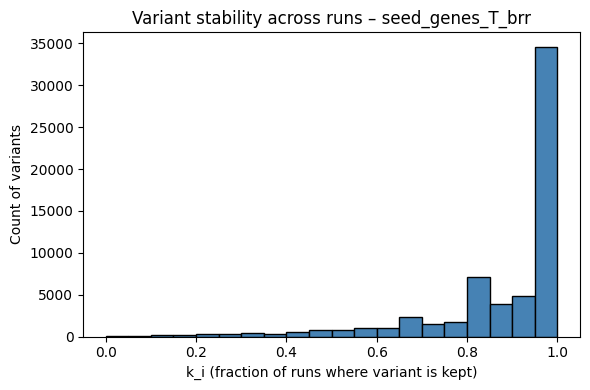

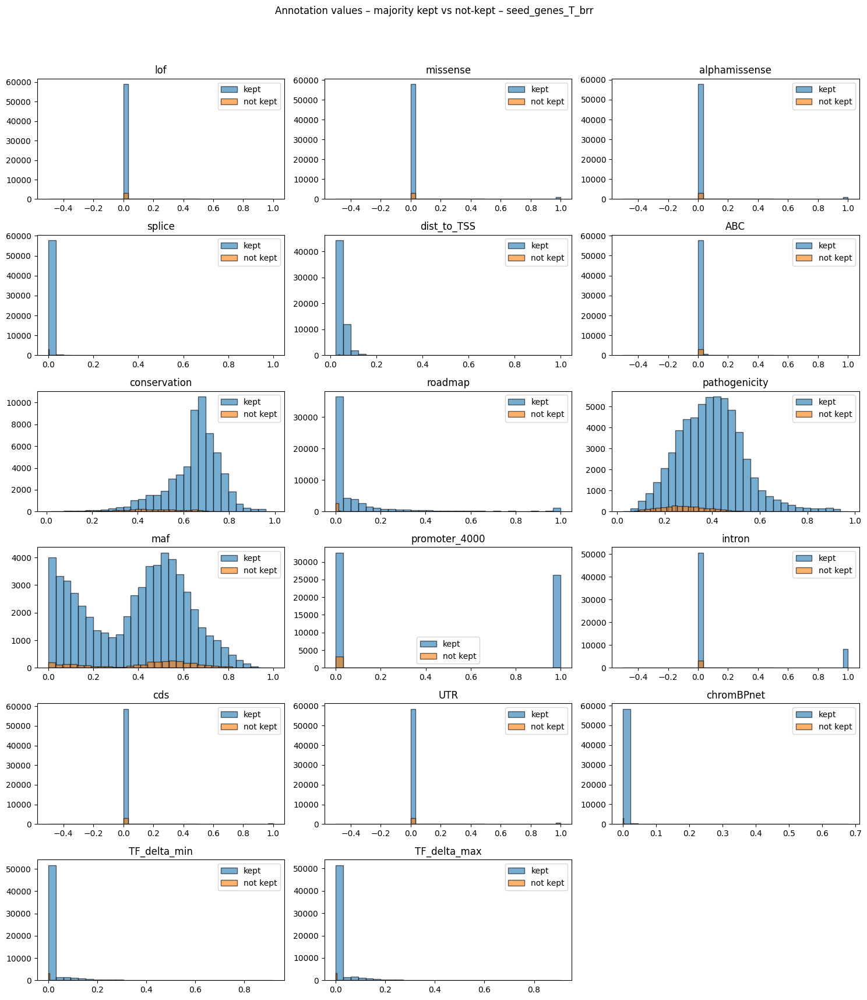


T experiment (majority kept): seed_genes_nowg
  Total variants: 62047
  Always kept (k_i == 1): 1028 (1.66%)
  Never kept (k_i == 0): 19462 (31.37%)
  Mixed (0 < k_i < 1):  41557 (66.98%)
  Majority kept (k_i >= 0.5): 21337 (34.39%)


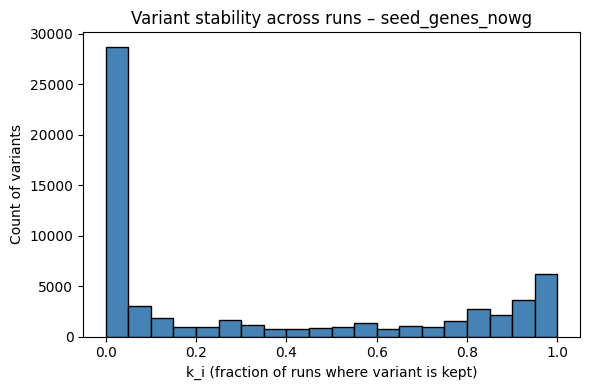

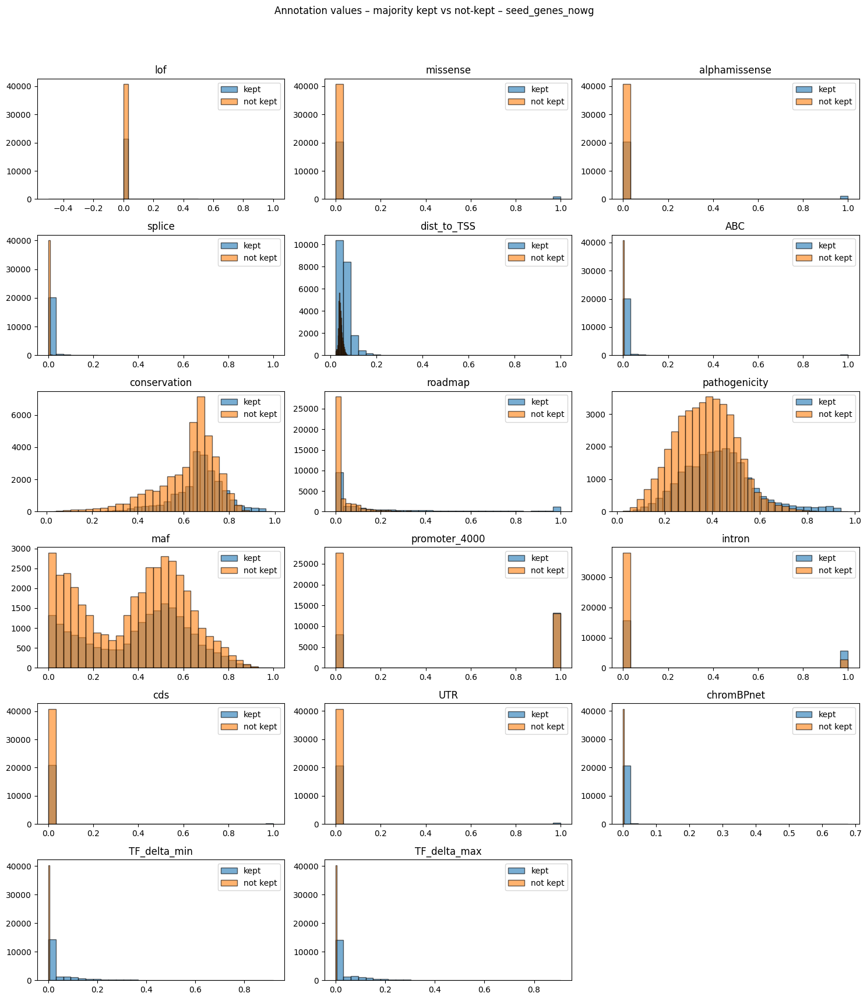


T experiment (majority kept): seed_genes_nowg_norhog
  Total variants: 62047
  Always kept (k_i == 1): 149 (0.24%)
  Never kept (k_i == 0): 53693 (86.54%)
  Mixed (0 < k_i < 1):  8205 (13.22%)
  Majority kept (k_i >= 0.5): 1898 (3.06%)


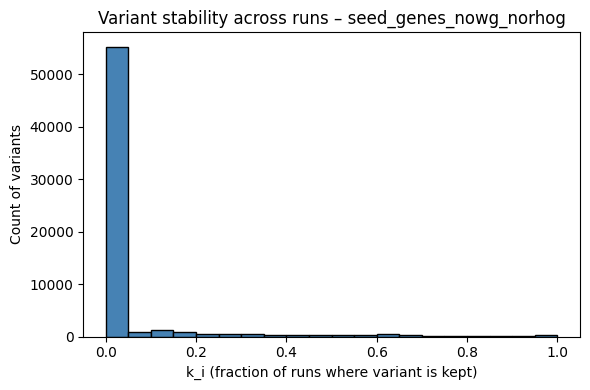

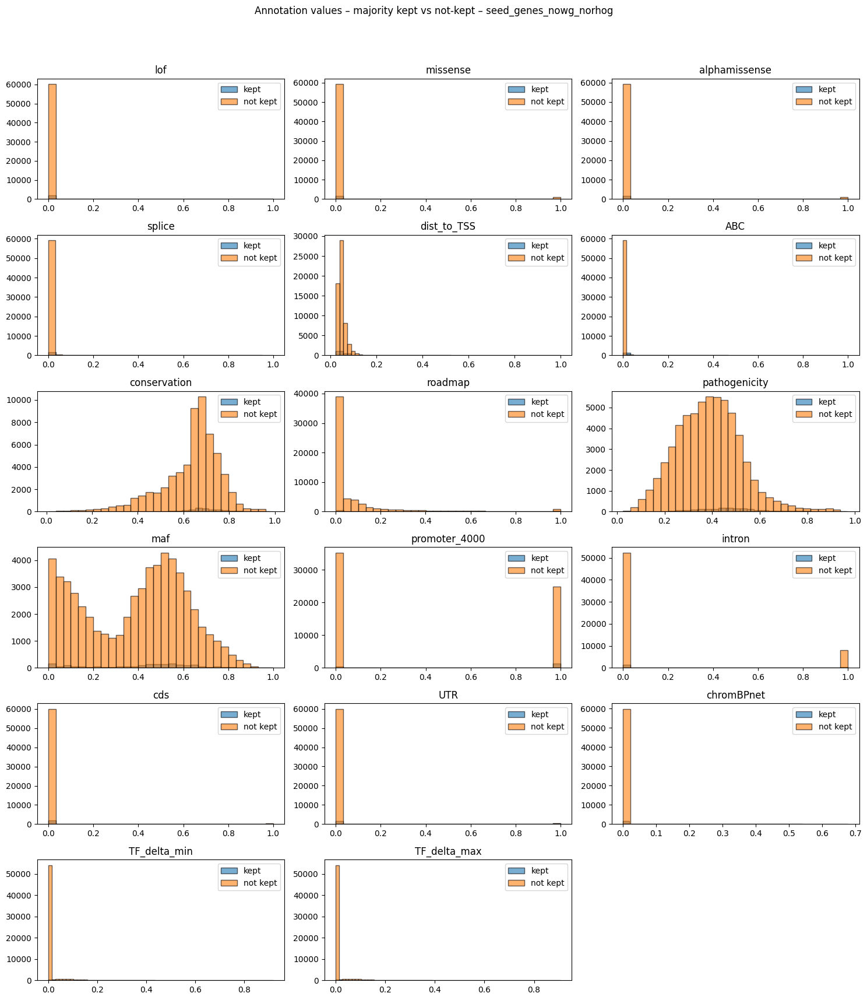

In [ ]:
summarize_T_majority_kept_and_annotation_distributions()

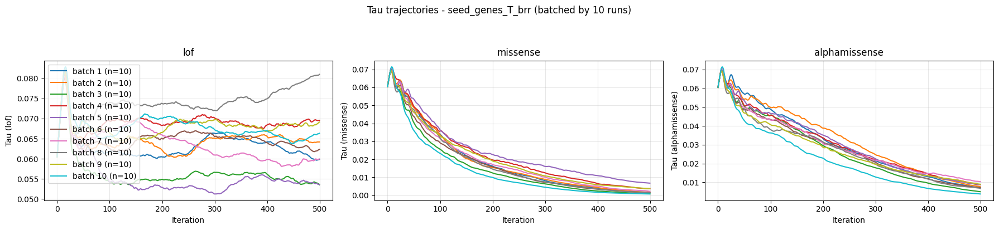

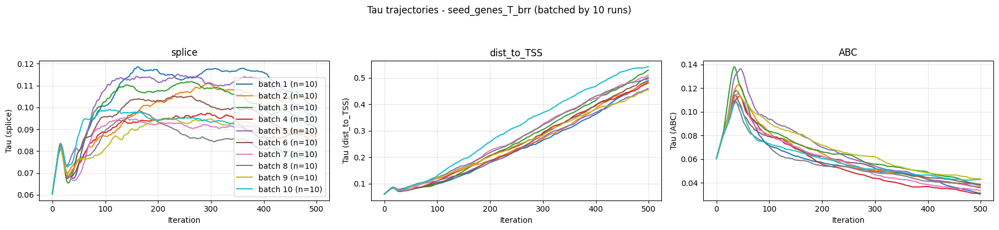

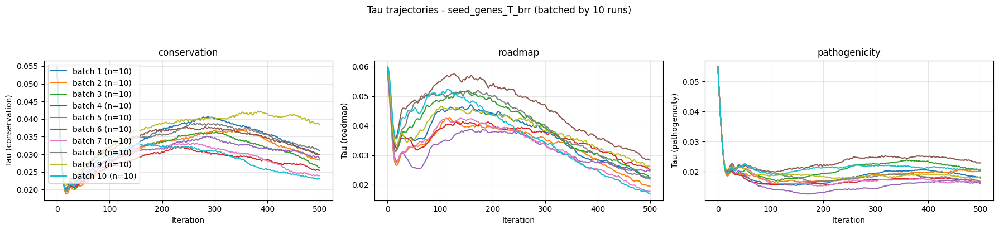

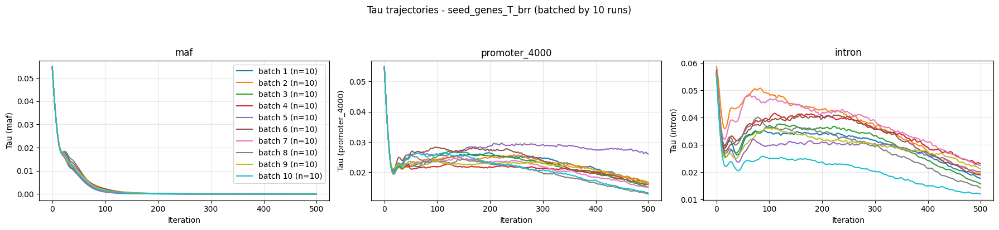

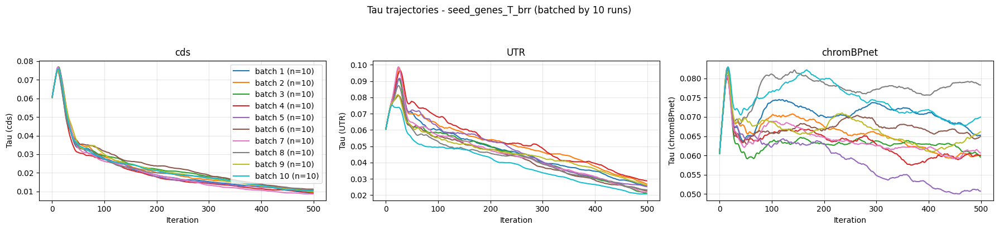

...

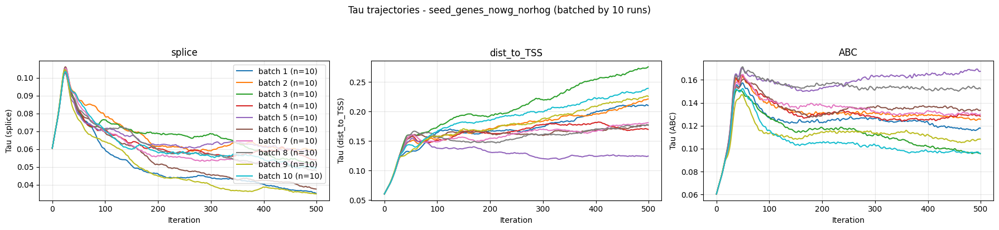

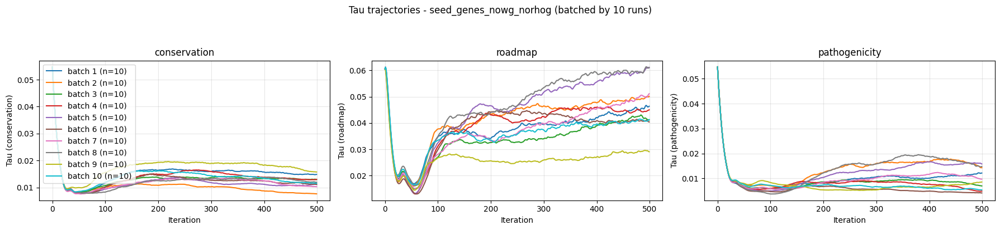

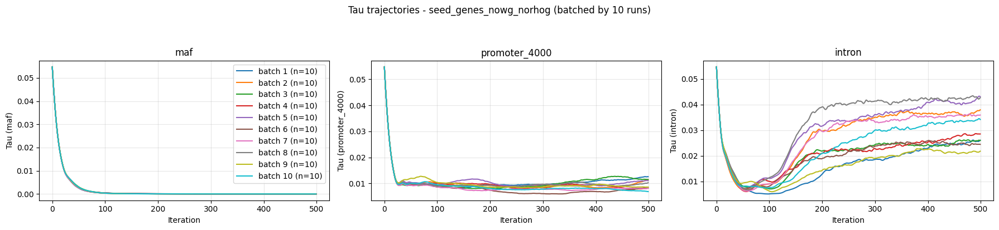

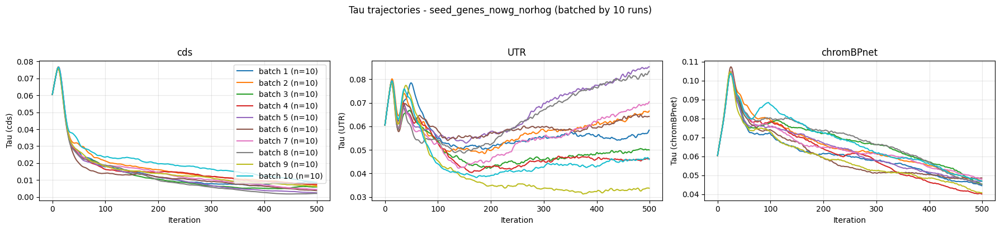

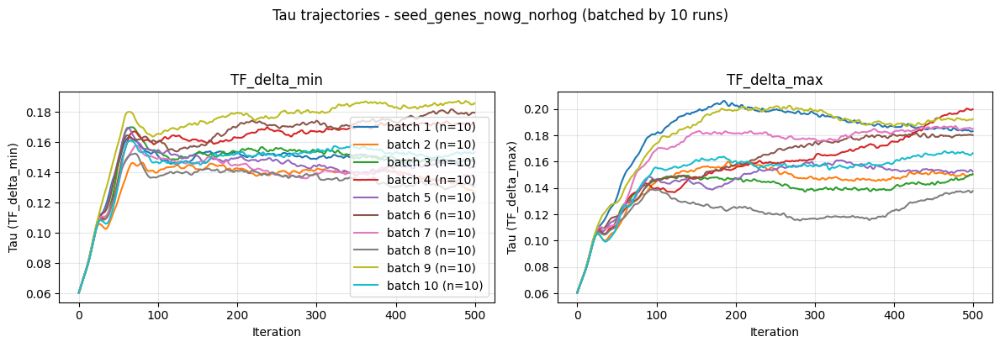

In [10]:
from parmigiano_joint_plot_helpers import plot_tau_trajectories_grouped_by_three

runs_df = discover_joint_runs(NEW_RESULTS_BASE)

plot_tau_trajectories_grouped_by_three(
    runs_df=runs_df,
    base_dir=NEW_RESULTS_BASE,
    batch_size=10,
    group_size=3,
    load_joint_run_files=load_joint_run_files,
)